# Fault development (WT04)

The notebook contains fault development analysis using vibration data from WT04. The analysis is mostly done using unsupervised machine learning techniques.

In [6]:
#### Looking at the following intervals in the traditional analysis:
intervals_wt01 = [3, 98, 204, 301, 407]
intervals_wt02 = [7, 101, 213, 293, 413]
intervals_wt03 = [1, 102, 199, 301, 411]
intervals_wt04 = [4, 102, 198, 306, 423]

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os,os.path
from scipy import stats
import glob # To count files in folder
import os.path
import progressbar
from tqdm.notebook import tqdm
from math import pi
from numpy.fft import rfftfreq, rfft
from scipy.fftpack import next_fast_len
from scipy.signal import spectrogram
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from IPython.display import Markdown

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
module_paths = []
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/hybrid_analysis_process_functions/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/utils/")))
for module_path in module_paths:
    if module_path not in sys.path:
        print("appended")
        sys.path.append(module_path)

import functions as f
import wt_data, ff_transform, explore_fft_time_data, envelope, build_dataset,\
load_raw_signals, envelope, envelope_emd,plotting_methods,\
resample_signals, filter_signals, plotting_methods,filters,correlation_coeff,\
clustering,feature_extraction,polycoherence,plot_eemd,correlation_plot


appended
appended
appended
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
/Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src


In [3]:
c, p = f.color_palette()
sns.set(context='paper', style='whitegrid', palette=np.array(p))
plt.style.use(ROOT_PATH+"/utils/plotparams.rc")

In [6]:
vib_signal, times, op_data_intervals, _ = load_raw_signals.load_raw('gearbox','wt04')

File exist


In [ ]:
# SLOW: Find out which indexes to remove:
remove_these = build_dataset.find_indexes_to_remove('WTG04')

In [4]:
df_times_unfiltered = pd.read_csv('/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt04/interval_dates_wt04.csv')

In [4]:
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to {df_times_unfiltered.iloc[350].Date}:</span>'))



<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to 2019-08-15 20:10:25:</span>

In [ ]:
df_times = pd.read_csv('/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt04/interval_dates_wt04.csv')

In [ ]:
# Removing the indexes that weren't in the other op dataset.
if(op_data_intervals.shape[0] != df_times.shape[0]):
    print('removing')
    remove_these=np.flip(remove_these)
    for index in remove_these:
        df_times = df_times.drop([df_times.index[index]])
df_times.shape
df_times = df_times.reset_index(drop=True)

try: 
    # df_times = df_times.drop(['index','Unnamed: 0'],axis=1)
    df_times = df_times.drop(['level_0'],axis=1)
except: 
    print('Could not remove')

In [242]:
df_times

NameError: name 'df_times' is not defined

Adding dates to a new df.

In [ ]:
dates=pd.DataFrame(df_times['Date'],columns=['Date'])

formatted_dates = []

for d in dates['Date']:
    formatted_dates.append((d.split(' ')[0][:7]))
new_df=op_data_intervals
new_df['Date'] = formatted_dates

In [ ]:
# The df times which is cleaned.
df_times

In [ ]:
op_data_intervals.shape[0]

In [ ]:
p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
p2=sns.color_palette("RdBu_r", n_colors=7)
p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
sns.palplot(new_palette)
print("aug       sept     okt     nov    des     jan     feb     mars   april   mai    juni   juli   august  sept    octo")

In [ ]:
number_of_boxplots = len(result.groupby('Date').nunique())
number_of_boxplots

In [ ]:
import datetime
input1 = '23/12/2011'
my_date = datetime.datetime.strptime(input1, "%d/%m/%Y")
print(my_date.strftime("%d %b, %Y")) # 23 Dec, 2011



In [ ]:
# Hardcode some seasonal colours

def plot_season_groups(df,features_to_plot,wtnum):
    
    df['Month'] = df['Date']

    '''p1=sns.color_palette("RdBu", n_colors=6)
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=6)[1:-1]
    new_palette=p1[0:-2]+p2+p3'''
    
    # Season colors
    p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
    new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
    
    number_of_boxplots = len(result.groupby('Date').nunique())
            
    for i in range(len(features_to_plot)):
        feat = features_to_plot[i]
    
        # formatting title
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        fig = plt.figure(figsize=(15, 5))
        plot=sns.violinplot(data=df, x='Month', y=features_to_plot[i], palette=new_palette)
        
        # Calculate number of obs per group & median to position observation number
        medians = df.groupby('Date')[feat].median().values
        nobs = df['Date'].value_counts().values # number of observations for feature
        nobs = [int(x) for x in nobs.tolist()]
        # nobs = ["n: " + i for i in nobs]
        #nobs = ["N = " + i for i in nobs]
        print(nobs)
        # Add it to the plot
        pos = range(len(nobs))
        
        
        labels=plot.get_xticklabels()

        nobs = [f"N = {nobs[i]}\n {labels[i].get_text()}" for i in pos]

        plot.set_xticklabels(nobs)
        
        #for tick,label in zip(pos,plot.get_xticklabels()):
            #print(label)
            #plot.text(pos[tick], medians[tick] + 0.03, nobs[tick], horizontalalignment='center', size='large', color='black', weight='semibold')


        
        # plot = sns.swarmplot(data=df, x='Month', y=features_to_plot[i], color=".25")
        plt.xticks(rotation=45)
        plt.style.use(ROOT_PATH+"/utils/plotparams.rc")
        plt.title("WT04: Grouping "+ r"$\bf{"+str(feat_name)+"}$" +" by month")
        # plt.ylabel(ylabels[i])
        plt.xlabel('Month and number of samples (N)')
        
        '''

        if features_to_plot[i]=='WindSpeed':
            plt.ylim(3,30)

        if features_to_plot[i]=='AvgSpeed':
            plt.ylim(600,1650)

        if features_to_plot[i]=='AvgPower':
            plt.ylim(300,4000)
        '''
        plt.tight_layout()

        # Saving
        save_path=f'../../plots/features/'
        plt.savefig(f'{save_path}/grouped_by_month/{wtnum}_{features_to_plot[i]}.png',dpi=300)

        plt.show()

        
# features_to_plot = ['AvgPower', 'WindSpeed', 'AvgSpeed']        
# plot_season_groups(new_df,features_to_plot,4)

### EEMD and Bi-spectrum inspection

In [ ]:
raw_imfs_path='/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt04/eemds_wt04/'
file_count = len(glob.glob1(raw_imfs_path,"*.zip"))
print(file_count)

## Plotting an EEMD:

In [ ]:
new_row = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
new_row2 = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
df1=pd.DataFrame(new_row)
df2=pd.DataFrame(new_row2)

pd.concat([df1,df2])

In [ ]:
a=np.array(vib_signal[4][0:20000])
envelope_emd.eemd('WT04',4,'HSS Gearbox', a,times[4][0:20000])

In [ ]:

intervals = [4, 102, 198, 306, 423]
# fig1, axs = plt.subplots(2,2, figsize=(15, 20), facecolor='w', edgecolor='k')
#axs=axs.flatten()
for i,interval_num in enumerate(intervals):
    # reading form file
    imf_df=pd.read_csv(raw_imfs_path+f'raw_wt04_interval_number_{interval_num}.zip')
    timestamp_of_signal=df_times[df_times.index==interval_num]['Date'][interval_num]

    # plot_eemd.plot_imfs_and_kurtosis(raw_imfs_path,'eemd_wt04_interval_400',times,'zip',plot_num_intervals)
    plot_eemd.plot_n_imfs_and_kurtosis(4,imf_df,interval_num,timestamp_of_signal,f'eemd_wt04_interval_{interval_num}',times,'zip',number_to_print=6)
    #axs[i].


## Bi-spectrum

In [ ]:
print(f'The duration of the signal which bi-spectrum features are extracted \
from is {times[0][3000]}')

### Plotting one bi-spectrum with raw signal
This is plotted for comparison with the other wind turbines. This is based on the unfiltered signal.

In [ ]:


sig=vib_signal[0][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


sig=vib_signal[400][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


### Loading the HP signals (6000 Hz)
We need this signal for early fault detection, where the literature states that faulty characteristics first show up in the higher frequencies.

In [7]:
def load_6000_filtered(filtered_path):
    num_csvs = len([f for f in os.listdir(filtered_path) 
         if f.endswith('.csv') and os.path.isfile(os.path.join(filtered_path, f)) and f[0]=='f'])

    filtered_signals = []
    filtered_freqs = []
    columns = []
    for i in tqdm(range(num_csvs)):
        acc=pd.read_csv(filtered_path+'filtered_raw_6000_'+str(i)+'.csv')
        columns.append('filtered_' + str(i))
        filtered_signals.append(acc.values.T[0])
        filtered_freqs.append(acc.shape[0] / times[i][-1])
        print(f'Reading {i} / {num_csvs} files', end='\r')

    filtered_signals = np.asarray(filtered_signals)
    filtered_signals
    return filtered_signals

filtered_path = '/Volumes/OsvikExtra/signal_data/raw_filtered_6000Hz/gearbox/wt04/filtered/'
filtered_signals=load_6000_filtered(filtered_path)

Reading 423 / 424 files


### Plotting bi-spectrum for one interval (HP 6000 Hz filtered)
Since we are looking at the higher frequency bands, we want to use bi-spectrum features from these.

In [ ]:

def plot_bispec(wt_num,interval_num):
    fs=25600
    sig=filtered_signals[interval_num][0:3000] # selecting to be stationary

    N=20000 # Select the N to split the signal into N parts
    kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
    freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
    # polycoherence.plot_polycoherence(freq1, fre2, bispec)
    # plt.show()
    # print(bispec.shape)

    bispec_half = np.triu(bispec) # remove symmetric part

    polycoherence.plot_polycoherence(freq1, fre2, bispec_half)
    var = df_times.iloc[interval_num]['Date']
    plt.title(f'WT0{wt_num}: Bispectrum plot HP filtered signal (interval {interval_num}).\n Date: {var}')
    SAVE_FILE_NAME = f'WT04_bispectrum_interval_{interval_num}'
    plt.savefig(f'../../plots/bispectrums/{SAVE_FILE_NAME}.png',dpi=200)
    plt.tight_layout()
    plt.show()
    
    
plot_interval1 = intervals_wt04[0]
plot_interval2 = intervals_wt04[-1]
    
plot_bispec(4,plot_interval1)

plot_bispec(4,plot_interval1)
plot_bispec(4,3)
plot_bispec(4,plot_interval2)

# Features

### Creating/Loading feature_df
Time domain: Statistical features
Frequency domain: Bi-spectrum features
Time-frequency domain: 5 first IMF features

In [8]:
feature_df=feature_extraction.generate_feature_df(4,25600,op_data_intervals,filtered_signals)


All features already exist. They are returned.


In [32]:
feature_df

,Unnamed: 0,Index,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,rms,kurt,skewness,...,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5
0,1,1,2697.461426,2332.100098,9.1,256.100006,1456.464986,0.033015,0.053185,-0.000215,...,0.128934,0.199547,0.123689,0.067405,0.033058,-0.583278,-0.089923,0.073555,0.002797,0.253335
1,2,2,2606.151855,2843.500000,10.0,240.199997,1468.503663,0.031462,0.040718,0.001279,...,0.141049,0.199823,0.133223,0.089423,0.042151,-0.635902,-0.064192,0.017138,0.026398,-0.036868
2,3,3,2541.849854,2694.100098,10.5,71.099998,1458.875183,0.031657,0.024448,-0.000109,...,0.131875,0.200069,0.122657,0.078038,0.033254,-0.523575,-0.044261,-0.096247,-0.199085,-0.080378
3,4,4,2853.304199,3293.399902,12.7,269.399994,1460.635409,0.027586,-0.023993,0.000146,...,0.163514,0.216670,0.140043,0.118589,0.046916,-0.646218,-0.099547,-0.048886,-0.163708,-0.123223
4,6,6,2752.077881,3040.300049,9.7,143.899994,1490.140485,0.032342,0.001400,0.000229,...,0.134606,0.200470,0.122431,0.087678,0.031932,-0.653365,-0.122907,-0.096827,-0.015448,-0.337581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,417,417,3138.052002,3203.399902,11.4,293.899994,1504.263633,0.032898,0.020255,-0.001694,...,0.141823,0.201432,0.125395,0.102048,0.036957,-0.607446,-0.112843,-0.057036,-0.306957,-0.102348
265,418,418,2579.166504,2568.500000,10.3,266.500000,1469.268894,0.034313,0.022511,-0.001152,...,0.116881,0.189908,0.110006,0.062467,0.030619,-0.548407,-0.084009,-0.184907,-0.106996,-0.161947
266,420,420,2891.829346,2819.300049,10.4,318.600006,1487.214505,0.032864,0.013819,-0.000442,...,0.135683,0.197433,0.127404,0.088303,0.035183,-0.678697,-0.180693,-0.023698,-0.051267,-0.175283
267,421,421,2581.525879,3160.600098,10.2,317.000000,1489.520070,0.032324,-0.009423,0.001826,...,0.130820,0.187764,0.125732,0.091929,0.033915,-0.588242,-0.194495,0.142984,-0.320447,-0.208195


In [13]:
feature_df[feature_df['WindSpeed']<0]

,Unnamed: 0,Index,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,rms,kurt,skewness,...,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5
5,7,7,558.968140,-1000.0,-10.0,-500.0,1485.840981,0.029461,0.089627,0.000260,...,0.169679,0.209504,0.132836,0.153882,0.045391,-0.757224,-0.126510,-0.072116,-0.450725,-0.220473
94,143,143,1534.409180,-1000.0,-10.0,-500.0,1488.087957,0.030111,0.041987,-0.000705,...,0.154751,0.186645,0.120138,0.157176,0.045502,-0.511391,-0.264880,-0.178380,-0.567286,-0.297460
203,316,316,2170.065186,-1000.0,-10.0,-500.0,1484.101068,0.029897,0.026908,0.001151,...,0.154713,0.198228,0.135652,0.124673,0.050359,-0.602698,-0.105408,-0.065919,-0.251959,0.069819
220,347,347,2496.386475,-1000.0,-10.0,-500.0,1487.859431,0.029889,0.008421,-0.001241,...,0.183193,0.215321,0.140994,0.169250,0.049963,-0.655372,-0.088865,-0.142586,-0.634771,-0.259941
248,390,390,760.454468,-1000.0,-10.0,-500.0,1510.301613,0.032326,0.007442,0.001637,...,0.142800,0.194937,0.122048,0.118801,0.036738,-0.665788,-0.162969,-0.154217,-0.180711,-0.313665


Removing fetures `['Unnamed: 0','NacelleDirection','entropy']` from `features_cleaned`

In [9]:
features_cleaned = feature_df.drop(['Unnamed: 0','NacelleDirection','entropy'],axis=1)
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

Boxplot of `features_cleaned`, just filtered on RPM 1450.

--- 9.34580111503601 seconds ---


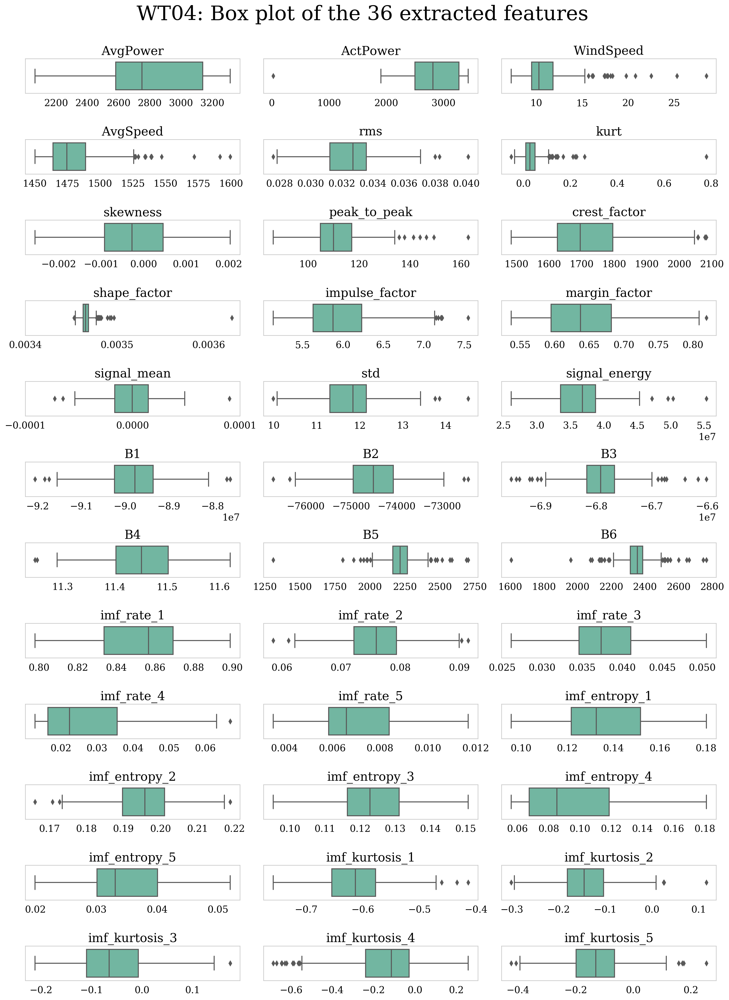

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as plticker


#first_half_features = features_cleaned.columns[:len(features_cleaned.columns)//2]
#second_half_features = features_cleaned.columns[len(features_cleaned.columns)//2:]

#subsets=[first_half_features,second_half_features]

import time
start_time = time.time()

fig,axs = plt.subplots(9,4,figsize=(15,23))

fig.suptitle(f"WT04: Box plot of the 36 extracted features",fontsize=30)

fig.tight_layout()
# plt.subplots_adjust(top=0.96)

i=1
for column in features_cleaned:
    if (column == 'Index'):
        continue

    ax = fig.add_subplot(13,3,i)
    ax.set_title(column,fontsize=18)
    sns.boxplot(features_cleaned[column],palette="Set2")
    ax.set_xlabel('')
    ax.grid(False)

    if (column == 'shape_factor' or column=='signal_mean'):
        #loc = plticker.MultipleLocator(base=5) # this locator puts ticks at regular intervals
        #ax.xaxis.set_major_locator(loc)
        ax.set_xticks(ax.get_xticks()[::2])


    # Removing y ticks and y labels
    frame1 = plt.gca()
    frame1.axes.yaxis.set_ticklabels([])
    frame1.axes.get_yaxis().set_ticks([])

    for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(14) 

    i+=1

# Remove the empty plots
flat = axs.flatten()
for a in flat:
    fig.delaxes(a)



# fig.subplots_adjust(hspace=0.9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
print("--- %s seconds ---" % (time.time() - start_time))

fig.savefig("../../plots/box_plots/boxplot_WT04.eps",format='eps',bbox_inches='tight')

plt.show()


Creating some latex tables of `features_cleaned`

In [33]:
def df_to_latex(dataframe,index=True):
    text =  dataframe.to_latex(index=index)
    return text

def head_row_col(dataframe):
    print_df = dataframe.head().iloc[:,[1,2,3,4,5]].copy()
    print_df["..."]="..."
    return print_df

In [32]:
text1 = df_to_latex(feature_df[['AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']].head().round(2))
print(text1)
print('##########')

dftime=head_row_col(feature_df[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']].head().round(4))

text2 = df_to_latex(dftime)
print(text2)

\begin{tabular}{lrrrr}
\toprule
{} &  AvgPower &  ActPower &  WindSpeed &  AvgSpeed \\
\midrule
0 &   2697.46 &    2332.1 &        9.1 &   1456.46 \\
1 &   2606.15 &    2843.5 &       10.0 &   1468.50 \\
2 &   2541.85 &    2694.1 &       10.5 &   1458.88 \\
3 &   2853.30 &    3293.4 &       12.7 &   1460.64 \\
4 &   2752.08 &    3040.3 &        9.7 &   1490.14 \\
\bottomrule
\end{tabular}

##########
\begin{tabular}{lrrrrrl}
\toprule
{} &    kurt &  skewness &  peak\_to\_peak &  crest\_factor &  shape\_factor &  ... \\
\midrule
0 &  0.0532 &   -0.0002 &      130.0330 &     2082.5868 &        0.0035 &  ... \\
1 &  0.0407 &    0.0013 &      105.4482 &     1642.2583 &        0.0035 &  ... \\
2 &  0.0244 &   -0.0001 &      106.5230 &     1642.1474 &        0.0035 &  ... \\
3 & -0.0240 &    0.0001 &       88.9242 &     1714.2318 &        0.0035 &  ... \\
4 &  0.0014 &    0.0002 &      108.4315 &     1722.1613 &        0.0035 &  ... \\
\bottomrule
\end{tabular}



In [ ]:
i = 11
j = 1
a = np.zeros(shape=(i,j))
print(a.shape)
a=a.T
df = pd.DataFrame(data=a,columns=['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy'])
print(df_to_latex(df))


### Removing some noisy points in the ```imf_kurtosis_X``` and ```WindSpeed``` features
But first, removing some noisy data.

In [10]:
# Need to clean away these crazy points
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_2']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_3']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_4']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_5']>5]['Index']))

# filtering away some noisy points:
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_1']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_2']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_3']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_4']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_5']<5]


try:
    features_cleaned=features_cleaned.drop(['cluster_assigned'],axis=1)
except:
    print("Could not remove cluster_assigned")

print(feature_df.shape)
print(features_cleaned.shape)


# Remove netgative wind speed

features_cleaned = features_cleaned[features_cleaned['WindSpeed'] > 0]
print(features_cleaned.shape)


features_cleaned=features_cleaned.reset_index(drop=True)

[ 85 238]
[ 67  85 227 238]
[ 67  85 227 238]
[ 67  85 227 238]
Could not remove cluster_assigned
(269, 40)
(265, 37)
(260, 37)


### Plotting features one by one

In [ ]:
# PLOT EACH COLUMN HERE:
def save_feature_figs(feature):
    for feat in features_cleaned.columns:
        
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        ax = features_cleaned[feat].plot(style='.-',title="WT04:\n Feature: " + r"$\bf{"+str(feat_name)+"}$",figsize=(15,3))
        ax.set_xlabel('Interval index (Time)')
        ax.set_ylabel('Feature value')
        
        plt.xlim(0,features_cleaned.shape[0])
        save_path=f'../../plots/features/{feature}'
        if (not os.path.exists(save_path)):
            try:
                os.mkdir(save_path)
            
            except OSError:
                print("Not able to create folder")

        # path exists now
        plt.tight_layout()
        plt.savefig(f'{save_path}/{feat}_and_{feature}.png',dpi=300)
        plt.show()

save_feature_figs('wt04_features_plotted_time')

Grouping `features_removed` by month and plotting  each feature to look for patterns

In [ ]:
try:
    dt_times=df_times.drop(['Unnamed: 0'],axis=1)
except:
    print('Not removed')
    dt_times = df_times

In [ ]:
formatted_dates = []

for d in dt_times['Date']:
    # df_times.append((d.split(' ')[0][:7]))
    formatted_dates.append((d.split(' ')[0][:7]))
    
new_times_df= pd.DataFrame(formatted_dates,columns=['Date'])
new_times_df['Index'] = new_times_df.index
# new_times_df=new_times_df.drop([0],axis=1) # removing a weird column

new_times_df['Index'] = new_times_df.index

Adding the month column to the features cleaned df and plotting the boxplots.

Note here that the features are cleaned!!

In [ ]:
result = pd.merge(features_cleaned,
                  new_times_df,
                  left_on='Index',
                  right_on='Index',
                  how='left')


date_old_format=(result['Date']).values



# print(date_old_format)

import datetime
def reformat_date(date):    
    my_date = datetime.datetime.strptime(date, "%Y-%m")
    return (my_date.strftime("%m-%Y"))

result['Date']=[reformat_date(d) for d in date_old_format]

# Now, plot it: 

wtnum = 4
features_to_plot = ['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5']

plot_season_groups(result,features_to_plot,wtnum)

# Correlation plot

In [ ]:
features_cleaned.columns

Is this created on the raw features_cleaned?

Is this created on the raw features_cleaned

In [ ]:
features_cleaned_corr = features_cleaned.drop(['Index'],axis=1)
correlation_plot.create_save_correlation_plot('wt04_features','WT04: Feature correlation',features_cleaned_corr)

# Clustering

The function below, ```calculate_cluster_stats```, is used to calculate statistics from each cluster. In particular, we are here looking for clusters that consist of higher indexes, i.e. vibration intervals taken at a later point in time. These later intervals are more likely to have fault characteristics visible.

In [19]:
def calculate_cluster_stats(clusterDict):
    '''
        Args:
            clusterDict (Dictionary):
                keys (Integer): cluster index
                values (List): List containing index of intevals
        Returns:
            df_stats (pd.DataFrame): DataFrame containing stats about the cluster input.
    '''
    df=[]
    means=[]
    num_intervals=[]
    num_intervals_greater_than_350=[]
    percentage_greater_than_350=[]
    for i in range(len(clusterDict)):
        mean=np.mean(clusterDict[i])
        num_interval=len(clusterDict[i])
        num_interval_greater_than_350=len(list(filter(lambda index: index > 350, clusterDict[i])))
        percentage=round((num_interval_greater_than_350/num_interval)*100)

        means.append(mean)
        num_intervals.append(num_interval)
        num_intervals_greater_than_350.append(num_interval_greater_than_350)
        percentage_greater_than_350.append(percentage)


    df.append(num_intervals)
    df.append(means)
    df.append(num_intervals_greater_than_350)
    df.append(percentage_greater_than_350)
    df=np.asarray(df)


    df_stats = pd.DataFrame(data=df.T,columns=['number_of_intervals_in_cluster','avg_index','number_of_indexes_greater_than_350','percentage_intervals_greater_than_350'])
    return df_stats

**Anomaly** detecion is performed using three approaches:
 - **[1]** Some stats on the df
 - **[2]** DB-scan clustering
 - **[3]** KMeans clustering
 - **[4]** Isolation forest

In [15]:
wt_num = 4
wtnum=4

,Index
187,304
188,306
189,307
190,308
191,309
...,...
255,417
256,418
257,420
258,421


Some initial stats on the data, after all cleaning:
########################################
    - There are 45 signals over index 350
    - There are 215 signals below index 350
    - There are 27 signals between 300 and 350
########################################
LOCS: [-100.    0.  100.  200.  300.  400.  500.]
labels 
['\n2019-07-24', '0\n2018-08-04', '100\n2018-11-09', '200\n2019-03-02', '300\n2019-06-11', '400\n2019-10-02', '']


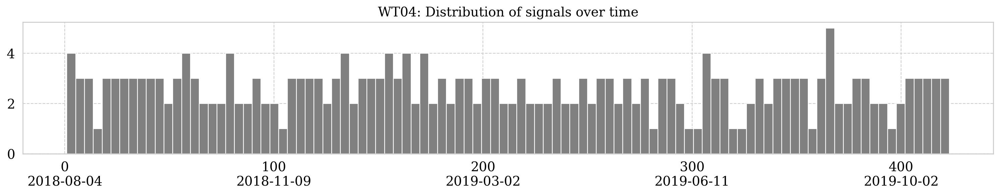

In [17]:
signals_over_index_350=(features_cleaned['Index'][features_cleaned['Index']>350]).shape

signals_0_to_100 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])

signals_300_to_350 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])
display(signals_300_to_350)
signals_300_to_350 = (signals_300_to_350['Index'][signals_300_to_350['Index']<350]).shape

print('Some initial stats on the data, after all cleaning:')
print('########################################')
print(f'    - There are {signals_over_index_350[0]} signals over index 350')
print(f'    - There are {features_cleaned.shape[0]-signals_over_index_350[0]} signals below index 350')
print(f'    - There are {signals_300_to_350[0]} signals between 300 and 350')
print('########################################')

# plt.scatter(features_cleaned['Index'],features_cleaned.index,s=20,edgecolor='#072159',color='none')
# features_cleaned['Index'].plot.scatter(x='index',y='Index')

'''
fig, ax = plt.subplots(figsize=(15, 4))
                       
ax=sns.violinplot(features_cleaned['Index'],color='lightgrey',title='Distribution of signals over time',ax=ax)
ax.set_title('WT04: Distribution of signal indexes')
plt.xlim(-100,530)
plt.setp(ax.collections, alpha=.5)
plt.tight_layout()

locs = ax.get_xticks()

labels = [item.get_text() for item in ax.get_xticklabels()]
for i in range(1,6):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

ax.set_xticklabels(labels)
'''

plt.figure(figsize=(15,3))
axx=(features_cleaned['Index']).hist(color='grey',bins=100)
#plt.margins(0)

locs = axx.get_xticks()
print('LOCS:',locs)
labels = [item.get_text() for item in axx.get_xticklabels()]

labels = [str(int(x)) for x in locs]
#labels = ["%.2f" % x for x in locs]


labels[0]=''
labels[-1]='' 
# labels=['', '0', '100', '200', '300', '400', '']
print('labels',labels[0])
# labels=['0','100','200','300','400']
for i in range(len(locs)-1):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

print(labels)
    
axx.set_xticklabels(labels)

plt.title(f'WT0{wtnum}: Distribution of signals over time')
plt.tight_layout()


save_path=f'../../plots/cluster_results'
plt.savefig(f'{save_path}/wt_{wt_num}_signal_distribution.png',dpi=300)
plt.show()

In [ ]:
axx=(features_cleaned['Index']).hist(color='grey')

In [272]:
df_times_unfiltered

,Unnamed: 0,Date
0,0,2018-08-04 18:26:31
1,0,2018-08-04 20:08:32
2,0,2018-08-05 12:37:17
3,0,2018-08-10 13:03:27
4,0,2018-08-11 12:54:56
...,...,...
426,0,2019-10-27 12:50:11
427,0,2019-10-28 07:12:54
428,0,2019-10-29 06:26:53
429,0,2019-10-29 22:46:59


## K-means raw (features_cleaned)
First, count the number of points after 350:


In [214]:
def kmeans(dataset_name,wt_num,SELECTED_FEATURES,max_cluster_num,print_latex=False,plottitle=''):

    '''INITIAL ELBOW METHOD:'''
    # plotting an additional plot which is not needed here
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans', knn_clusters=max_cluster_num,plot=False,dataset_name=dataset_name)
    
    # finding the max clusters based on values
    # Use calculate_cluster_stats to optimize.
    final_array=[]
    final_df = []
    max_cluster_number=[]
    intervals_in_max_cluster=[]
    max_percentages=[]
    intervals_greater_than_350=[]
    number_of_clusters=[]
    for i in tqdm(range(2,max_cluster_num+1)):
        cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=i,plot=False) # Cluster the points
        clusterDict=clustering.plot_clusters(plottitle,wt_num,i,cluster_labels,SELECTED_FEATURES,plot=False) # plot the clusters
        cluster_df=calculate_cluster_stats(clusterDict)
        # display(cluster_df[cluster_df['avg_index']>280])

        # Do some more work here... Add them to an array and build a dataframe
        max_percentage=(cluster_df['percentage_intervals_greater_than_350'].max())
        temp=cluster_df[cluster_df['percentage_intervals_greater_than_350']==max_percentage]
        interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())
        
        get_cluster = temp[temp['number_of_intervals_in_cluster']==interval_in_cluster]
        intervals_in_cluster_above_350 = get_cluster['number_of_indexes_greater_than_350']
                
        max_cluster_number.append(i)
        intervals_in_max_cluster.append(interval_in_cluster) # number of intervals in the max cluster (the cluster with most of the interesting points)
        intervals_greater_than_350.append(intervals_in_cluster_above_350.values[0]) # number of intervals greater tha 350
        max_percentages.append(max_percentage)

    # Appending to array        
    final_df.append(max_cluster_number)
    final_df.append(intervals_in_max_cluster)
    final_df.append(intervals_greater_than_350)
    final_df.append(max_percentages)

    final_df=np.asarray(final_df)

    final_df=pd.DataFrame(final_df.T,columns=['max_cluster_number','intervals_in_max_cluster','intervals_greater_than_350','max_percentages'])
    
    # Converting final_df columns to ints, except from the percentage column.
    for feat in final_df.columns:
        if feat != 'max_percentages':
            final_df[feat]=final_df[feat].apply(lambda x: int(x))
        else:
            continue
    
    #final_df.style.set_precision(0)
    text=(df_to_latex(final_df,False))
    if print_latex == True:
        print(text)
    #display(final_df)

    return final_df

 `run_kmeans` and select K based on the results of the next cell

In [213]:
# Run K-means with the selected K and df.
def run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):
    '''
    INPUTS:
        - data_set (Pandas Dataframe): The feature dataset.
    OUTPUTS:
        - cluster_df (Pandas DataFrame): Df containing clusters and samples.
    '''
    SELECTED_FEATURES=data_set
    max_cluster_num = k
    
    '''
    df = kmeans('4',SELECTED_FEATURES,max_cluster_num,dataset_name)

    #plt.scatter(df.max_cluster_number,df.max_percentages)
    #plt.show()

    display(df)
    '''
    SELECTED_CLUSTER_NUMBER = k # need to optimize this value

    # now plot this:
    
    # plotting elbow. 
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=SELECTED_CLUSTER_NUMBER,plot=True,dataset_name=dataset_name,selected_cluster=selected_cluster)

    # plotting cluster development and index distribution
    clusterDict=clustering.plot_clusters(plottitle,wt_num,k,cluster_labels,SELECTED_FEATURES,plot=True,dataset_name=dataset_name) # plot the clusters

    # display(calculate_cluster_stats(clusterDict))
    
    j=0
    if features_to_pairplot:
        for key, value in features_to_pairplot.items():
            dataset_name_= dataset_name + f'_{j}_'    
            clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            '''
            else:
                print('len is less or equal to 2')
                clustering.scatter_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            ''' 
            j+=1
    else:
        dataset_name1=dataset_name+'_1_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgSpeed','rms','B4'],cluster_labels,dataset_name=dataset_name1) # pair plot 1
        dataset_name2=dataset_name+'_2_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels, dataset_name=dataset_name2) # pair plot 2
        cluster_df=calculate_cluster_stats(clusterDict)
        cluster_df
        
    return cluster_labels


# Some other feature sets

In [174]:
# Different subsets:
operating_features=features_cleaned[['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']]

# Frequency-domain
bispectrum_features=features_cleaned[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']]
#bispectrum_features['Index'] = features_cleaned['Index']

# Frequency-domain
time_features=features_cleaned[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']]

# Time-frequency features (EEMD; IMFs)
imf_features=features_cleaned[['imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5']]

# IMF kurtosis features
imf_kurt_features=features_cleaned[['imf_kurtosis_1','imf_kurtosis_2','imf_kurtosis_3','imf_kurtosis_4','imf_kurtosis_5']]

In [166]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5', 'cluster_assigned'],
      dtype='object')

In [215]:
op_and_bispec_features = pd.concat([operating_features,bispectrum_features],axis=1)
op_and_time_features = pd.concat([operating_features,time_features],axis=1)
op_and_imf_kurtosis_features = pd.concat([operating_features,imf_kurt_features],axis=1)
op_and_imf_features = pd.concat([operating_features,imf_features],axis=1)

feature_mix=features_cleaned[['Index', 'AvgPower','WindSpeed', 'AvgSpeed','imf_rate_5','imf_kurtosis_5','B1','B5']]

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features,
                feature_mix    
               ]

features_sets_names= [
                'op_and_bispec_features',
                'op_and_time_features',
                'op_and_imf_kurtosis_features',
                'op_and_imf_features',
                'feature_mix'
               ]

### Running through the different subsets of dataframes with kmeans

In [1415]:
import matplotlib
# this method is just for plotting the different final_dfs (the dfs comaring the K values.)

def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    df.plot.scatter(x='intervals_in_max_cluster',y='max_cluster_number',c='max_percentages',cmap='Blues',s=50,ax=ax)

    # plt.scatter(df.intervals_in_max_cluster,df.max_cluster_number,s=100,c=df.max_percentages,cmap='Blues',norm=normalize)
    # plt.colorbar()
    # plt.clim(0,29)
    ax.set_ylabel('K')
    ax.set_xlabel('Total number of intervals in cluster')
    # ax.legend(title='Percentage of intervals in cluster with Index > 350')
    ax.set_title(f'{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

#### The whole DF first:

In [177]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5', 'cluster_assigned'],
      dtype='object')

In [178]:
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass

len(features_cleaned.columns)
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [187]:
# The whole DF
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>'))
wt_num = '4'
df=kmeans('all_36_features_initial',wt_num, features_cleaned,20,print_latex=True,plottitle='All 36 features initially')
display(df)

# plot_k_means_tuning(wt_num, df,'All 36 features')

<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,98.0,207.642857,18.0,18.0
1,162.0,206.092593,27.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,18.0,172.555556,2.0,11.0
1,85.0,214.929412,17.0,20.0
2,157.0,206.121019,26.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,17.0,171.764706,2.0,12.0
1,66.0,209.196970,13.0,20.0
2,106.0,210.009434,20.0,19.0
3,71.0,207.718310,10.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,63.0,212.507937,13.0,21.0
1,17.0,171.764706,2.0,12.0
2,41.0,194.243902,5.0,12.0
3,59.0,200.152542,8.0,14.0
4,80.0,220.687500,17.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,49.0,222.714286,12.0,24.0
1,17.0,175.705882,2.0,12.0
2,75.0,222.306667,17.0,23.0
3,19.0,166.157895,1.0,5.0
4,40.0,196.875000,5.0,12.0
5,60.0,202.183333,8.0,13.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,40.0,189.400000,5.0,12.0
1,23.0,172.956522,3.0,13.0
2,43.0,173.069767,3.0,7.0
3,39.0,218.897436,7.0,18.0
4,44.0,224.863636,10.0,23.0
5,55.0,245.600000,15.0,27.0
6,16.0,175.062500,2.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,44.0,169.545455,3.0,7.0
1,8.0,175.125000,1.0,12.0
2,36.0,226.555556,8.0,22.0
3,38.0,218.342105,7.0,18.0
4,55.0,245.600000,15.0,27.0
5,16.0,184.125000,2.0,12.0
6,39.0,193.794872,5.0,13.0
7,24.0,183.750000,4.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,214.138889,7.0,19.0
1,32.0,232.406250,8.0,25.0
2,24.0,197.708333,4.0,17.0
3,44.0,202.613636,6.0,14.0
4,15.0,167.400000,1.0,7.0
5,3.0,198.333333,1.0,33.0
6,23.0,198.304348,4.0,17.0
7,47.0,222.127660,10.0,21.0
8,36.0,189.527778,4.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,214.138889,7.0,19.0
1,34.0,239.529412,9.0,26.0
2,22.0,200.818182,4.0,18.0
3,45.0,202.688889,6.0,13.0
4,6.0,102.000000,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,23.0,198.304348,4.0,17.0
7,45.0,217.644444,9.0,20.0
8,12.0,219.916667,2.0,17.0
9,35.0,187.314286,4.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,225.031250,7.0,22.0
1,34.0,234.705882,9.0,26.0
2,19.0,213.473684,3.0,16.0
3,40.0,191.675000,5.0,12.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,24.0,208.500000,4.0,17.0
7,45.0,217.644444,9.0,20.0
8,13.0,208.923077,2.0,15.0
9,35.0,192.000000,4.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,215.750000,5.0,21.0
1,34.0,235.382353,9.0,26.0
2,23.0,250.956522,6.0,26.0
3,44.0,198.159091,5.0,11.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,17.0,201.588235,3.0,18.0
7,46.0,219.217391,9.0,20.0
8,13.0,208.923077,2.0,15.0
9,32.0,183.531250,4.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,20.0,219.650000,5.0,25.0
1,33.0,241.363636,9.0,27.0
2,25.0,239.360000,6.0,24.0
3,30.0,177.900000,2.0,7.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,16.0,188.437500,2.0,12.0
7,49.0,208.755102,9.0,18.0
8,13.0,208.923077,2.0,15.0
9,33.0,187.454545,4.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,168.761905,2.0,10.0
1,9.0,161.000000,1.0,11.0
2,14.0,160.857143,1.0,7.0
3,25.0,237.680000,5.0,20.0
4,32.0,262.750000,10.0,31.0
5,13.0,208.923077,2.0,15.0
6,33.0,186.151515,4.0,12.0
7,5.0,53.600000,0.0,0.0
8,11.0,185.000000,0.0,0.0
9,27.0,268.259259,11.0,41.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,25.0,217.200000,6.0,24.0
1,24.0,239.625000,7.0,29.0
2,20.0,238.900000,5.0,25.0
3,21.0,130.666667,0.0,0.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,20.0,199.650000,3.0,15.0
7,41.0,229.292683,9.0,22.0
8,23.0,221.956522,4.0,17.0
9,12.0,134.750000,1.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,225.666667,6.0,25.0
1,24.0,226.833333,6.0,25.0
2,19.0,243.684211,5.0,26.0
3,16.0,136.250000,1.0,6.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,16.0,182.562500,2.0,12.0
7,27.0,243.444444,5.0,19.0
8,20.0,234.300000,4.0,20.0
9,12.0,134.750000,1.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,225.666667,6.0,25.0
1,24.0,226.833333,6.0,25.0
2,19.0,243.684211,5.0,26.0
3,16.0,136.250000,1.0,6.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,16.0,182.562500,2.0,12.0
7,27.0,243.444444,5.0,19.0
8,20.0,234.300000,4.0,20.0
9,12.0,134.750000,1.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,23.0,227.347826,5.0,22.0
1,25.0,220.400000,6.0,24.0
2,20.0,242.200000,6.0,30.0
3,16.0,146.812500,1.0,6.0
4,3.0,69.333333,0.0,0.0
5,2.0,91.000000,0.0,0.0
6,14.0,193.500000,2.0,14.0
7,27.0,243.444444,5.0,19.0
8,21.0,220.047619,3.0,14.0
9,12.0,150.916667,1.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,173.428571,1.0,14.0
1,3.0,90.666667,0.0,0.0
2,26.0,207.346154,3.0,12.0
3,21.0,220.904762,4.0,19.0
4,15.0,213.733333,2.0,13.0
5,20.0,162.700000,2.0,10.0
6,24.0,221.958333,4.0,17.0
7,12.0,172.666667,2.0,17.0
8,31.0,251.612903,9.0,29.0
9,6.0,205.666667,1.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,173.428571,1.0,14.0
1,3.0,90.666667,0.0,0.0
2,21.0,198.000000,2.0,10.0
3,9.0,258.111111,2.0,22.0
4,16.0,205.625000,2.0,12.0
5,22.0,163.136364,2.0,9.0
6,23.0,230.434783,4.0,17.0
7,14.0,193.500000,3.0,21.0
8,30.0,251.000000,9.0,30.0
9,4.0,158.000000,0.0,0.0



\begin{tabular}{rrrr}
\toprule
 max\_cluster\_number &  intervals\_in\_max\_cluster &  intervals\_greater\_than\_350 &  max\_percentages \\
\midrule
                  2 &                        98 &                          18 &             18.0 \\
                  3 &                        85 &                          17 &             20.0 \\
                  4 &                        66 &                          13 &             20.0 \\
                  5 &                        80 &                          17 &             21.0 \\
                  6 &                        49 &                          12 &             24.0 \\
                  7 &                        55 &                          15 &             27.0 \\
                  8 &                        55 &                          15 &             27.0 \\
                  9 &                         3 &                           1 &             33.0 \\
                 10 &                        34 & 

,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,98,18,18.0
1,3,85,17,20.0
2,4,66,13,20.0
3,5,80,17,21.0
4,6,49,12,24.0
5,7,55,15,27.0
6,8,55,15,27.0
7,9,3,1,33.0
8,10,34,9,26.0
9,11,34,9,26.0


### Selecting K=14 and producing plots

In [145]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

Marker-styles not there.


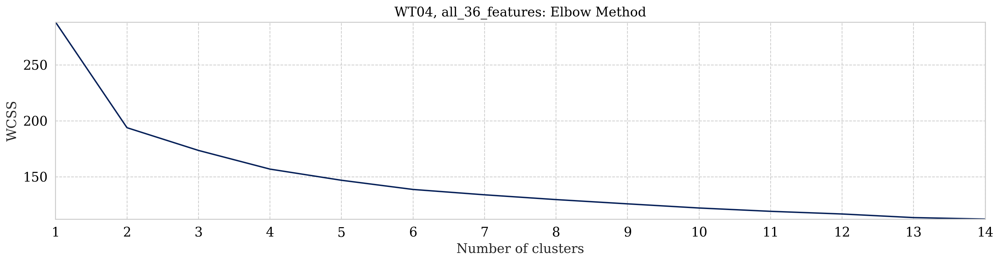

Did not replace


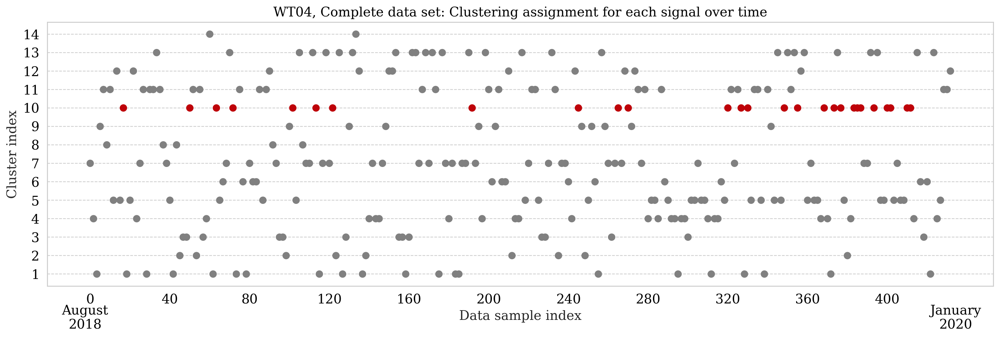

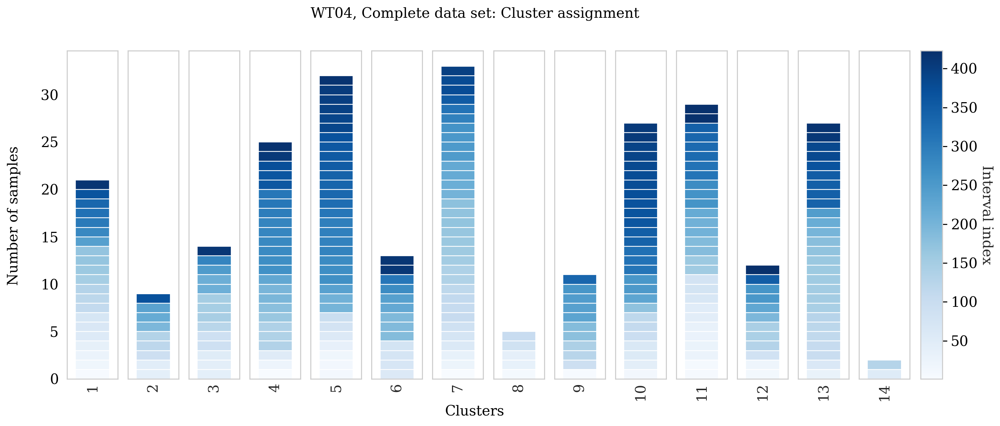

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,168.761905,2.0,10.0
1,9.0,161.000000,1.0,11.0
2,14.0,160.857143,1.0,7.0
3,25.0,237.680000,5.0,20.0
4,32.0,262.750000,10.0,31.0
5,13.0,208.923077,2.0,15.0
6,33.0,186.151515,4.0,12.0
7,5.0,53.600000,0.0,0.0
8,11.0,185.000000,0.0,0.0
9,27.0,268.259259,11.0,41.0


DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


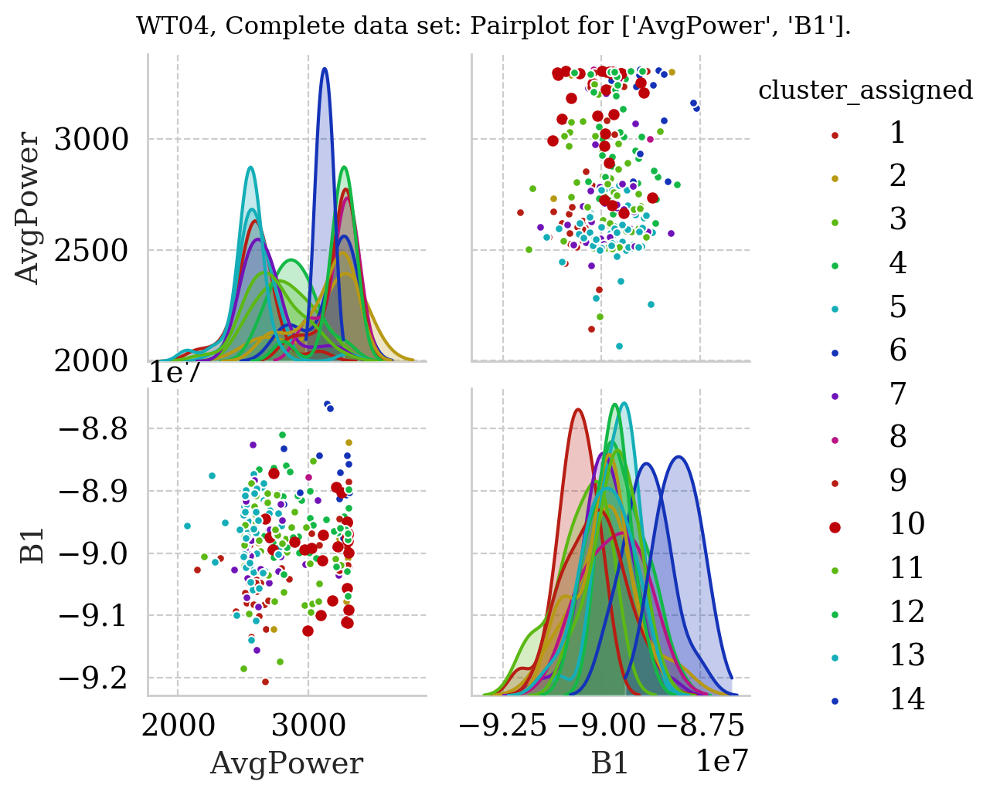

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


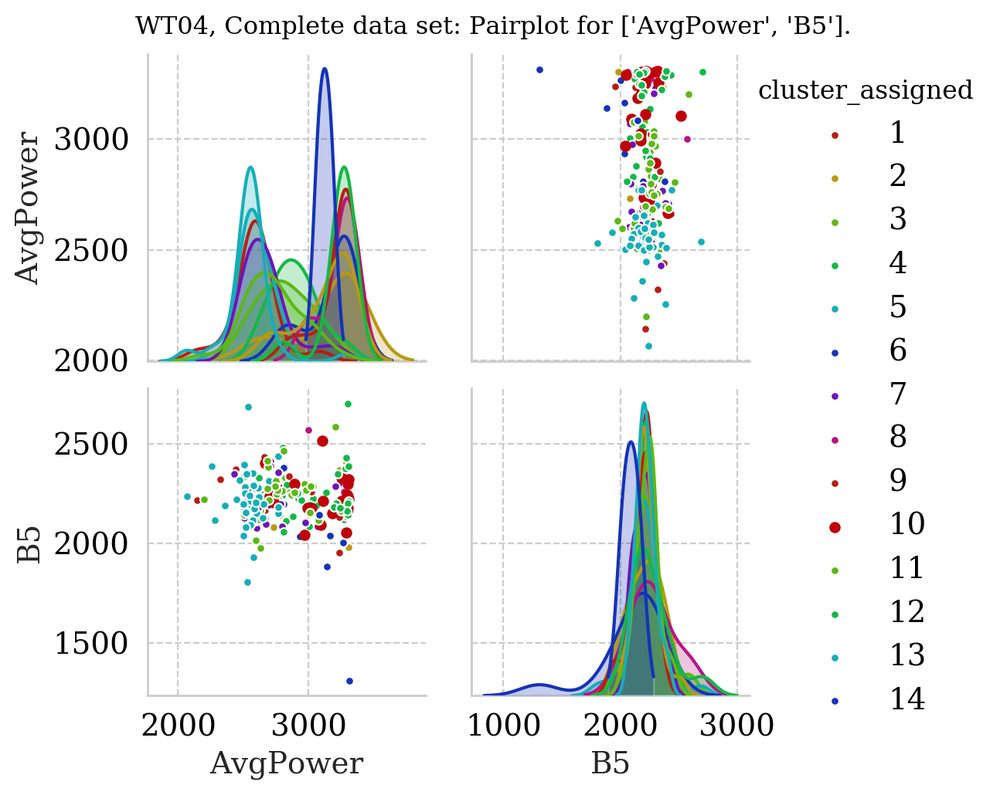

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


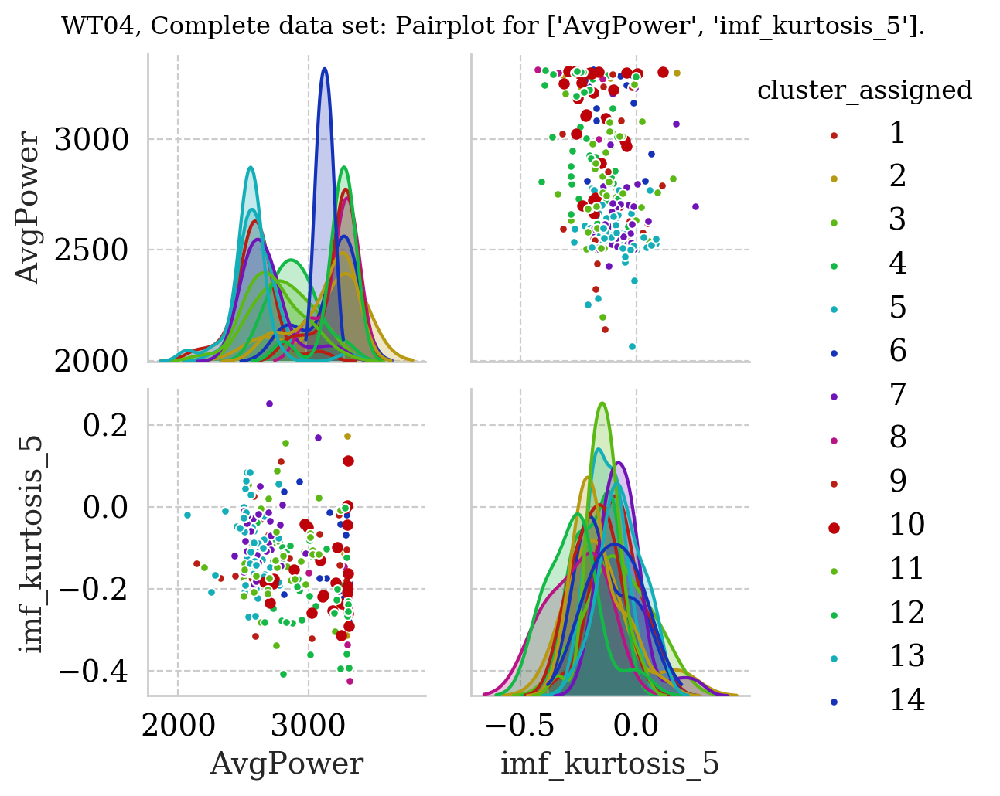

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


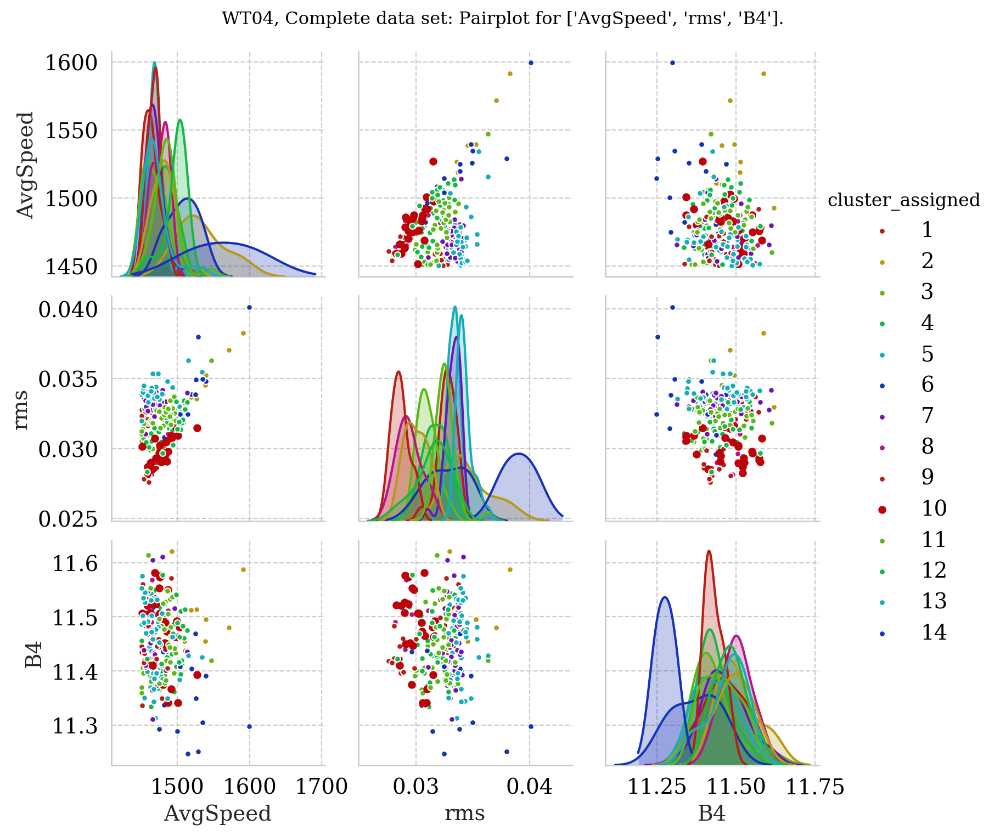

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


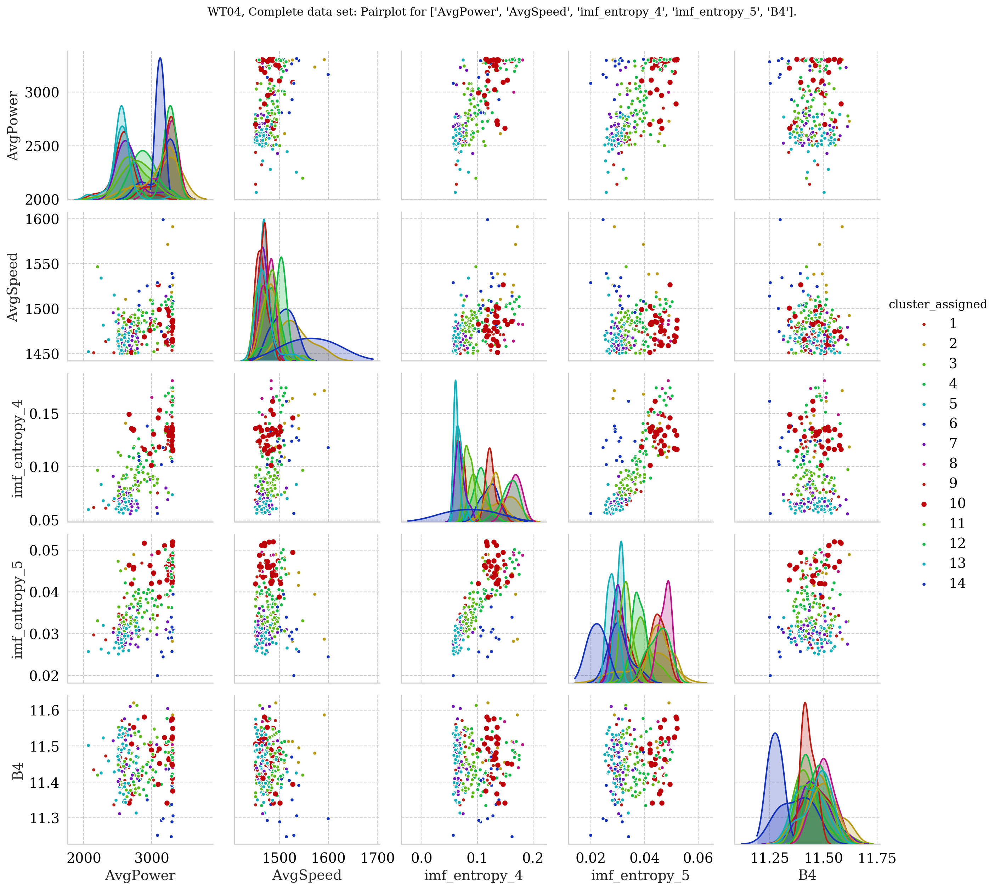

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


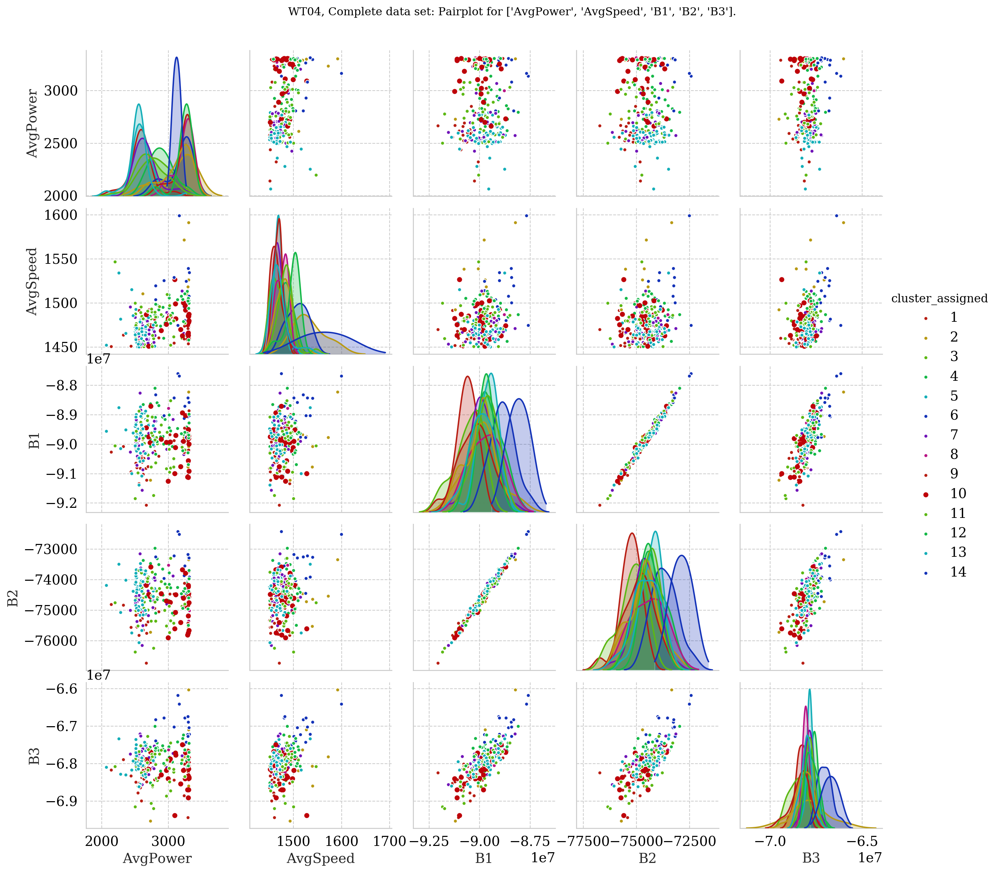

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


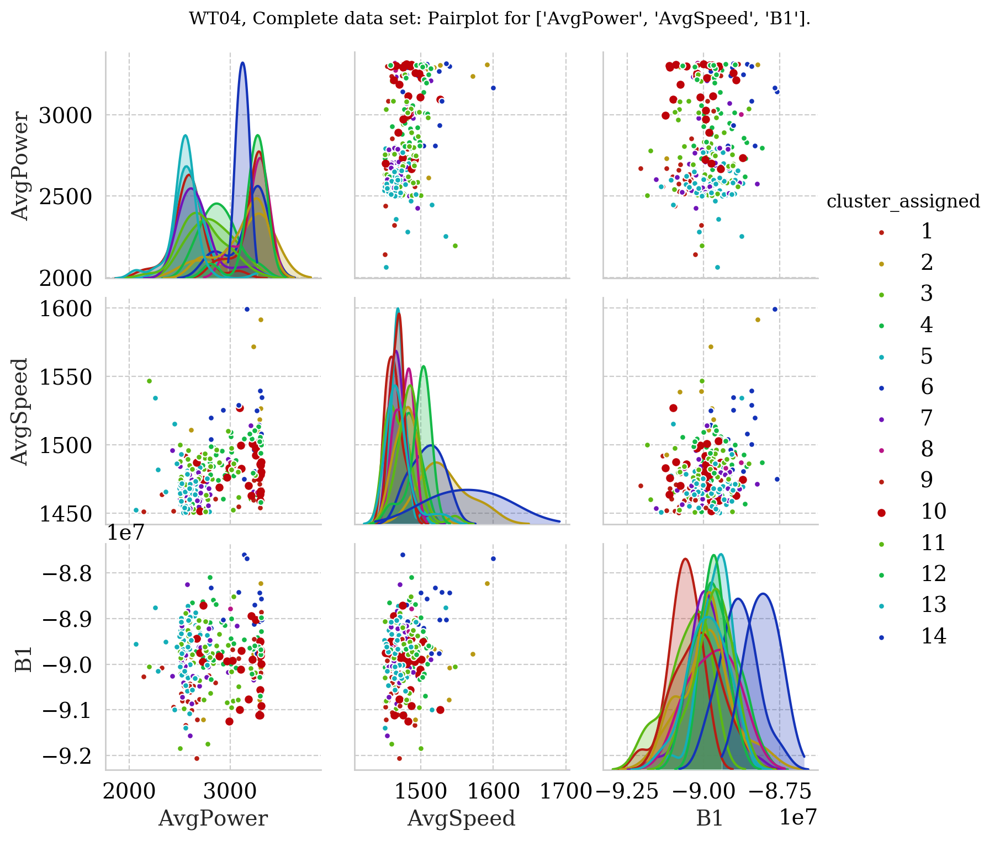

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


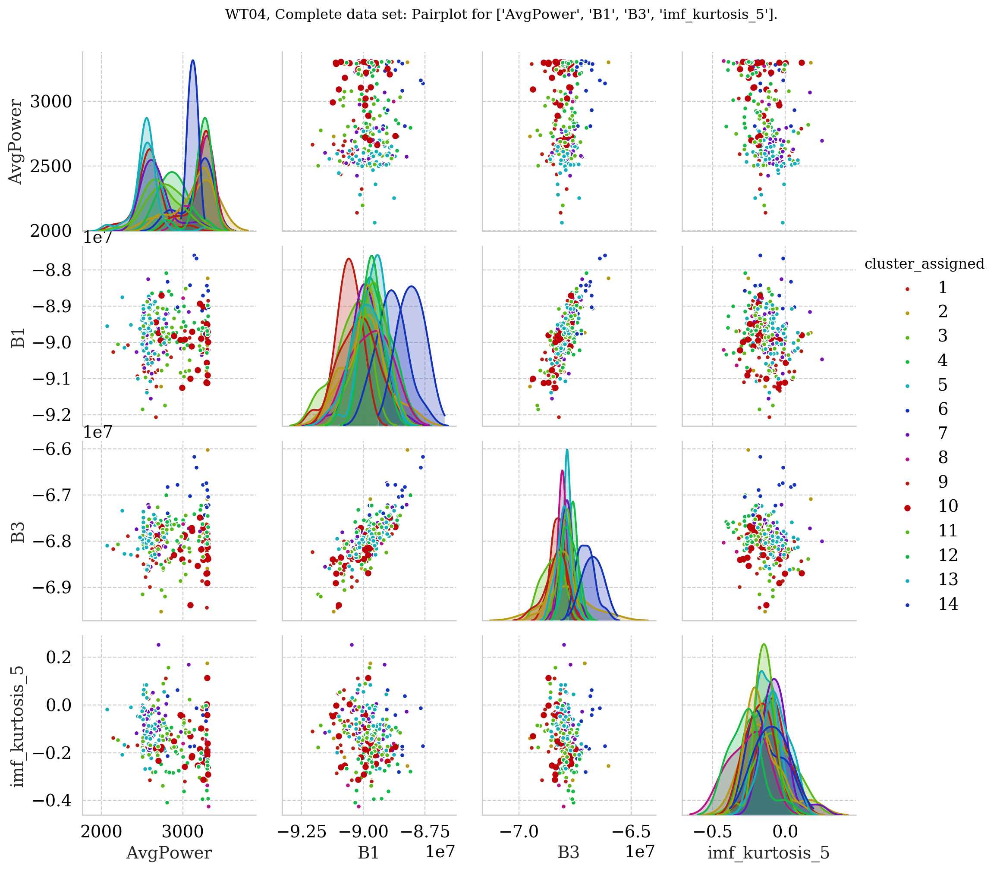

In [180]:
#ddef run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):

assigned = run_kmeans('Complete data set','4','all_36_features', features_cleaned,14,
                      selected_cluster=9,
                      fset1=['AvgPower','B1'],
                      fset2=['AvgPower','B5'],
                      fset3=['AvgPower','imf_kurtosis_5'],
                      fset4=['AvgSpeed','rms','B4'],
                      fset5=['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],
                      fset6=['AvgPower','AvgSpeed','B1', 'B2','B3'],
                      fset7=['AvgPower','AvgSpeed','B1'],
                      fset8=['AvgPower','B1','B3','imf_kurtosis_5'])

# Study the printed table as well.

#### Now, running the other subsets

In [191]:
wt_num = '4'
for i,features in enumerate(features_sets):
    print(features.columns)
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))    
    df=kmeans(features_sets_names[i],wt_num, features,20,print_latex=False,plottitle=f'{features_sets_names[i]} Initially')
    display(df)
    plt.show()

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'B1', 'B2',
       'B3', 'B4', 'B5', 'B6', 'cluster_assigned'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
10,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
10,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
12,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
10,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
10,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,164,29,18.0
1,3,100,23,23.0
2,4,106,23,22.0
3,5,66,14,21.0
4,6,51,11,22.0
5,7,39,10,26.0
6,8,37,9,24.0
7,9,37,9,24.0
8,10,36,9,25.0
9,11,1,1,100.0


Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'cluster_assigned'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
9,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
9,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
9,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
8,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
8,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
13,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
8,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
13,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
8,1.0,413.0,1.0,100.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,138,26,19.0
1,3,131,26,20.0
2,4,110,23,21.0
3,5,98,21,21.0
4,6,54,14,26.0
5,7,58,14,24.0
6,8,54,14,26.0
7,9,56,13,23.0
8,10,1,1,100.0
9,11,1,1,100.0


Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5', 'cluster_assigned'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
4,21.0,281.666667,6.0,29.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
4,19.0,287.368421,6.0,32.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
16,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,89,17,19.0
1,3,139,25,18.0
2,4,70,15,21.0
3,5,59,14,24.0
4,6,29,7,24.0
5,7,39,10,26.0
6,8,16,4,25.0
7,9,15,4,27.0
8,10,38,9,24.0
9,11,30,8,27.0


Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'cluster_assigned'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
14,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
14,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
11,1.0,413.0,1.0,100.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,98,19,19.0
1,3,106,22,21.0
2,4,106,22,21.0
3,5,48,13,27.0
4,6,42,12,29.0
5,7,41,12,29.0
6,8,39,12,31.0
7,9,25,7,28.0
8,10,20,5,25.0
9,11,19,5,26.0


Index(['Index', 'AvgPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_5',
       'imf_kurtosis_5', 'B1', 'B5', 'cluster_assigned'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,102,18,18.0
1,3,83,17,20.0
2,4,76,15,20.0
3,5,56,11,20.0
4,6,46,9,20.0
5,7,9,2,22.0
6,8,32,7,22.0
7,9,30,7,23.0
8,10,31,7,23.0
9,11,18,4,22.0


#### Selecting K-values for the other subsets and running them

In [195]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5', 'cluster_assigned'],
      dtype='object')

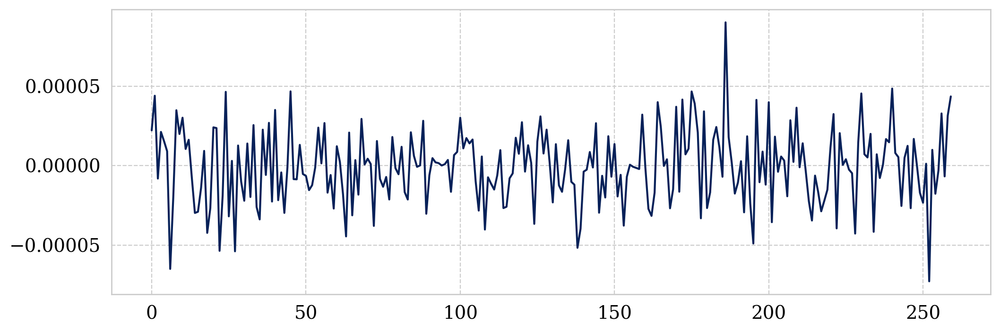

In [205]:
plt.plot(features_cleaned['signal_mean'])

In [206]:
features_cleaned

,Index,AvgPower,ActPower,WindSpeed,AvgSpeed,rms,kurt,skewness,peak_to_peak,crest_factor,...,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5,cluster_assigned
0,1,2697.461426,2332.100098,9.1,1456.464986,0.033015,0.053185,-0.000215,130.032981,2082.586821,...,0.199547,0.123689,0.067405,0.033058,-0.583278,-0.089923,0.073555,0.002797,0.253335,7
1,2,2606.151855,2843.500000,10.0,1468.503663,0.031462,0.040718,0.001279,105.448202,1642.258288,...,0.199823,0.133223,0.089423,0.042151,-0.635902,-0.064192,0.017138,0.026398,-0.036868,4
2,3,2541.849854,2694.100098,10.5,1458.875183,0.031657,0.024448,-0.000109,106.522959,1642.147358,...,0.200069,0.122657,0.078038,0.033254,-0.523575,-0.044261,-0.096247,-0.199085,-0.080378,1
3,4,2853.304199,3293.399902,12.7,1460.635409,0.027586,-0.023993,0.000146,88.924185,1714.231783,...,0.216670,0.140043,0.118589,0.046916,-0.646218,-0.099547,-0.048886,-0.163708,-0.123223,9
4,6,2752.077881,3040.300049,9.7,1490.140485,0.032342,0.001400,0.000229,108.431536,1722.161275,...,0.200470,0.122431,0.087678,0.031932,-0.653365,-0.122907,-0.096827,-0.015448,-0.337581,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,417,3138.052002,3203.399902,11.4,1504.263633,0.032898,0.020255,-0.001694,110.825996,1762.677624,...,0.201432,0.125395,0.102048,0.036957,-0.607446,-0.112843,-0.057036,-0.306957,-0.102348,4
256,418,2579.166504,2568.500000,10.3,1469.268894,0.034313,0.022511,-0.001152,109.646701,1604.560994,...,0.189908,0.110006,0.062467,0.030619,-0.548407,-0.084009,-0.184907,-0.106996,-0.161947,5
257,420,2891.829346,2819.300049,10.4,1487.214505,0.032864,0.013819,-0.000442,118.000328,1775.615718,...,0.197433,0.127404,0.088303,0.035183,-0.678697,-0.180693,-0.023698,-0.051267,-0.175283,11
258,421,2581.525879,3160.600098,10.2,1489.520070,0.032324,-0.009423,0.001826,107.326121,1531.866118,...,0.187764,0.125732,0.091929,0.033915,-0.588242,-0.194495,0.142984,-0.320447,-0.208195,11


In [241]:
fff=[]
for feat in feature_mix.columns[1:-1]:
    
    if feat != 'WindSpeed':
        fff.append(feat)  
        
print(fff)

['AvgPower', 'AvgSpeed', 'imf_rate_5', 'imf_kurtosis_5', 'B1']


In [239]:
features_cleaned

,Index,AvgPower,ActPower,WindSpeed,AvgSpeed,rms,kurt,skewness,peak_to_peak,crest_factor,...,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5,cluster_assigned
0,1,2697.461426,2332.100098,9.1,1456.464986,0.033015,0.053185,-0.000215,130.032981,2082.586821,...,0.199547,0.123689,0.067405,0.033058,-0.583278,-0.089923,0.073555,0.002797,0.253335,7
1,2,2606.151855,2843.500000,10.0,1468.503663,0.031462,0.040718,0.001279,105.448202,1642.258288,...,0.199823,0.133223,0.089423,0.042151,-0.635902,-0.064192,0.017138,0.026398,-0.036868,4
2,3,2541.849854,2694.100098,10.5,1458.875183,0.031657,0.024448,-0.000109,106.522959,1642.147358,...,0.200069,0.122657,0.078038,0.033254,-0.523575,-0.044261,-0.096247,-0.199085,-0.080378,1
3,4,2853.304199,3293.399902,12.7,1460.635409,0.027586,-0.023993,0.000146,88.924185,1714.231783,...,0.216670,0.140043,0.118589,0.046916,-0.646218,-0.099547,-0.048886,-0.163708,-0.123223,9
4,6,2752.077881,3040.300049,9.7,1490.140485,0.032342,0.001400,0.000229,108.431536,1722.161275,...,0.200470,0.122431,0.087678,0.031932,-0.653365,-0.122907,-0.096827,-0.015448,-0.337581,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,417,3138.052002,3203.399902,11.4,1504.263633,0.032898,0.020255,-0.001694,110.825996,1762.677624,...,0.201432,0.125395,0.102048,0.036957,-0.607446,-0.112843,-0.057036,-0.306957,-0.102348,4
256,418,2579.166504,2568.500000,10.3,1469.268894,0.034313,0.022511,-0.001152,109.646701,1604.560994,...,0.189908,0.110006,0.062467,0.030619,-0.548407,-0.084009,-0.184907,-0.106996,-0.161947,5
257,420,2891.829346,2819.300049,10.4,1487.214505,0.032864,0.013819,-0.000442,118.000328,1775.615718,...,0.197433,0.127404,0.088303,0.035183,-0.678697,-0.180693,-0.023698,-0.051267,-0.175283,11
258,421,2581.525879,3160.600098,10.2,1489.520070,0.032324,-0.009423,0.001826,107.326121,1531.866118,...,0.187764,0.125732,0.091929,0.033915,-0.588242,-0.194495,0.142984,-0.320447,-0.208195,11


In [240]:
features_cleaned.to_csv('../../features_wt04.csv')

In [ ]:
g=sns.pairplot(features_cleaned,vars=fff[0:2], 
            hue='Index',
            diag_kind=None,plot_kws={"s": 50})

In [ ]:
g=sns.pairplot(features_cleaned,vars=feature_mix.columns, 
            hue='Index',
            diag_kind=None, palette='Blues',plot_kws={"s": 50})

NameError: name 'cluster_method' is not defined

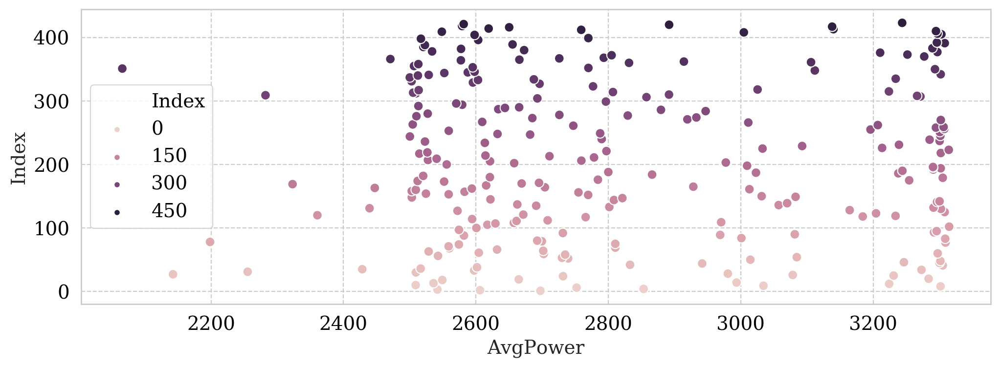

In [238]:
for feauture in features_cleaned:
    sns.scatterplot(x='AvgPower', y=feauture, data=features_cleaned,hue='Index',s=50)
    save_path=f'../../plots/cluster_results/wt0{wt_num}'
    plt.savefig(f'{save_path}/wt{wt_num}_{cluster_method}_{k}_{dataset_name}_{feat1}_{feat2}_clusters_scatter.png',dpi=300)
    
    
    plt.show()
    

<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


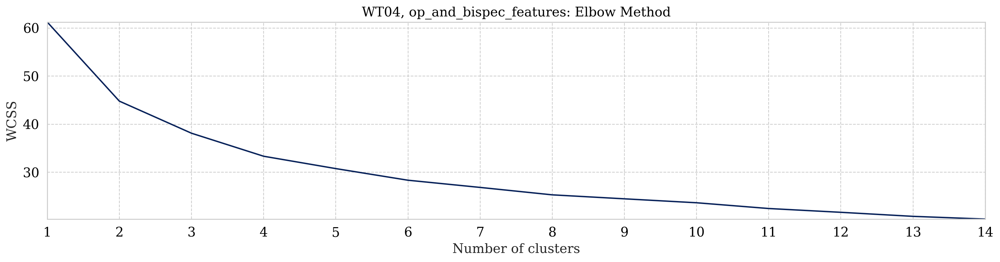

Did not replace


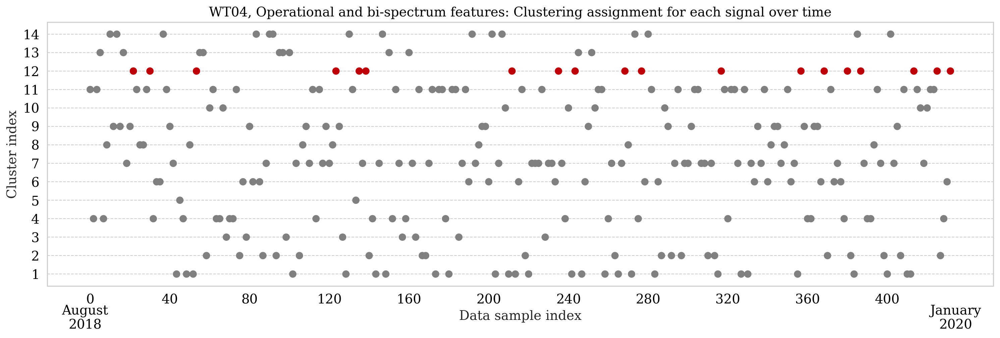

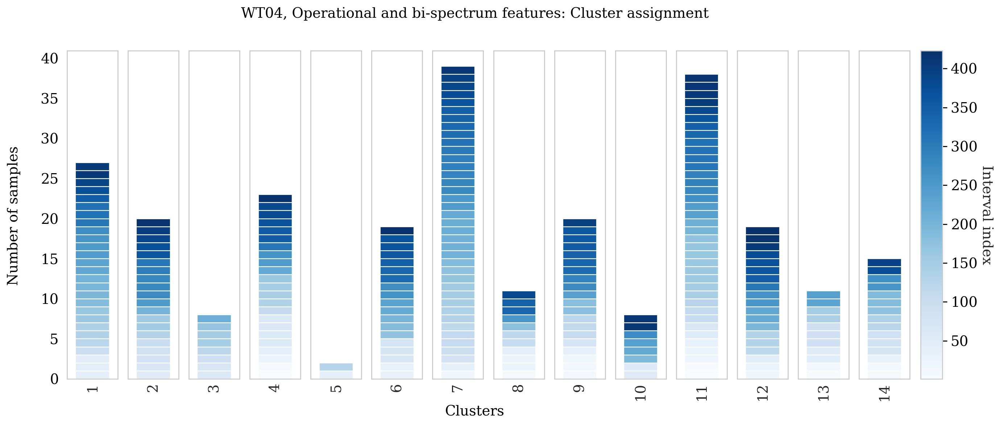

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,27.0,224.962963,4.0,15.0
1,20.0,233.200000,5.0,25.0
2,8.0,128.375000,0.0,0.0
3,23.0,187.782609,6.0,26.0
4,2.0,84.500000,0.0,0.0
5,19.0,228.736842,4.0,21.0
6,39.0,229.076923,5.0,13.0
7,11.0,165.363636,1.0,9.0
8,20.0,206.100000,4.0,20.0
9,8.0,233.125000,2.0,25.0


DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


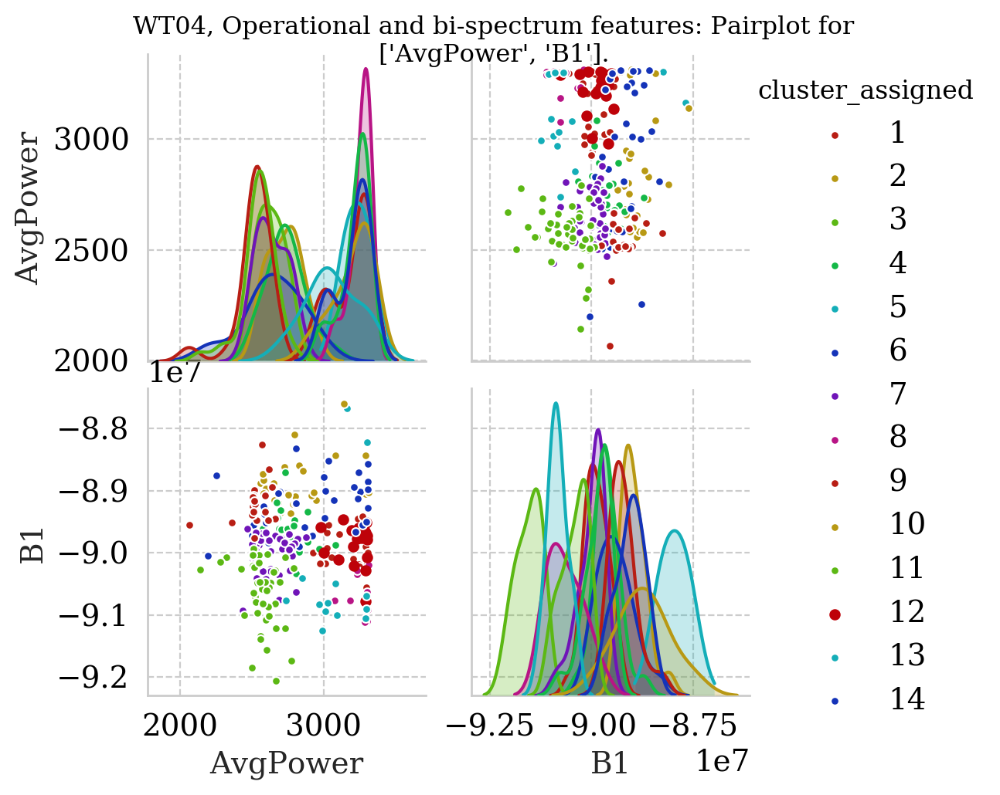

<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


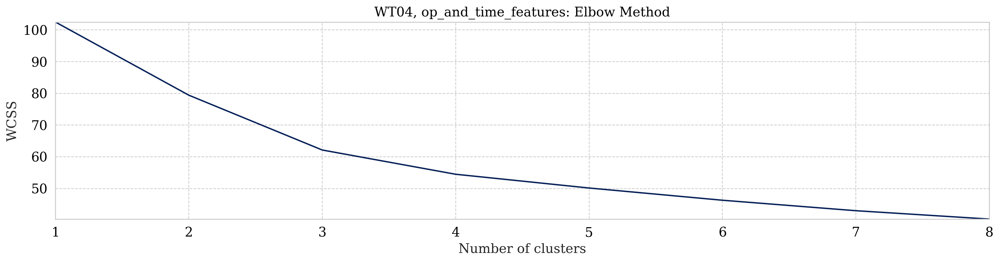

Did not replace


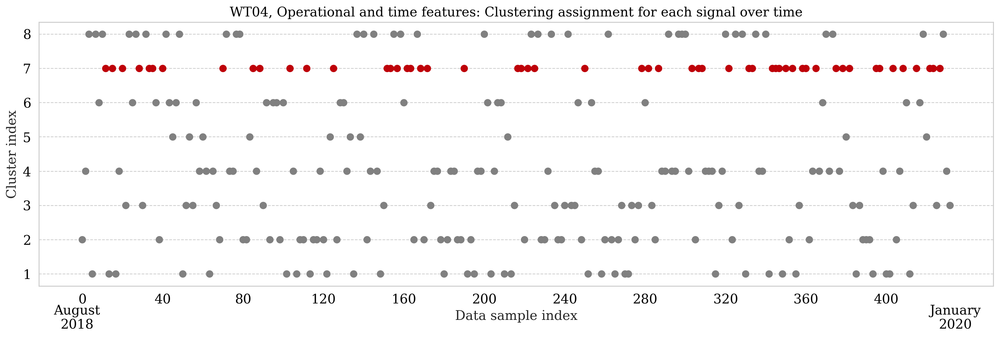

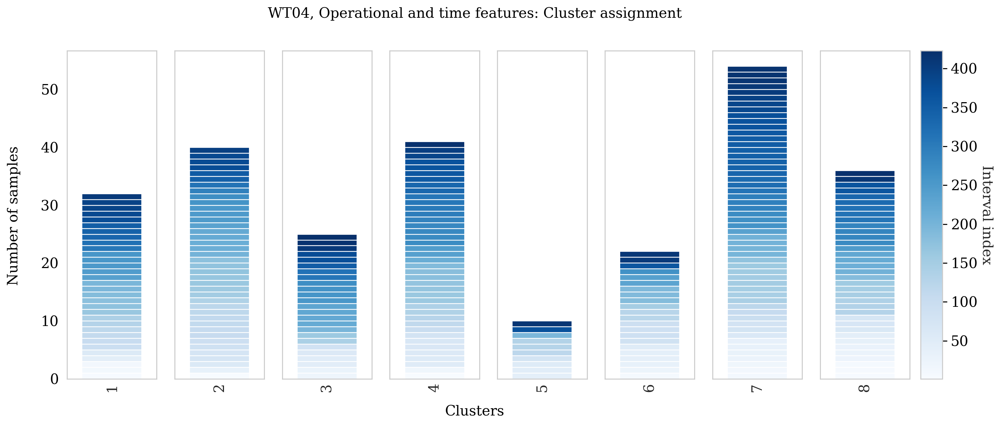

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,211.531250,5.0,16.0
1,40.0,195.500000,5.0,12.0
2,25.0,228.040000,5.0,20.0
3,41.0,216.170732,7.0,17.0
4,10.0,157.700000,2.0,20.0
5,22.0,156.136364,3.0,14.0
6,54.0,236.074074,14.0,26.0
7,36.0,189.527778,4.0,11.0


DIFFERENT HUES [1 2 3 4 5 6 7 8]


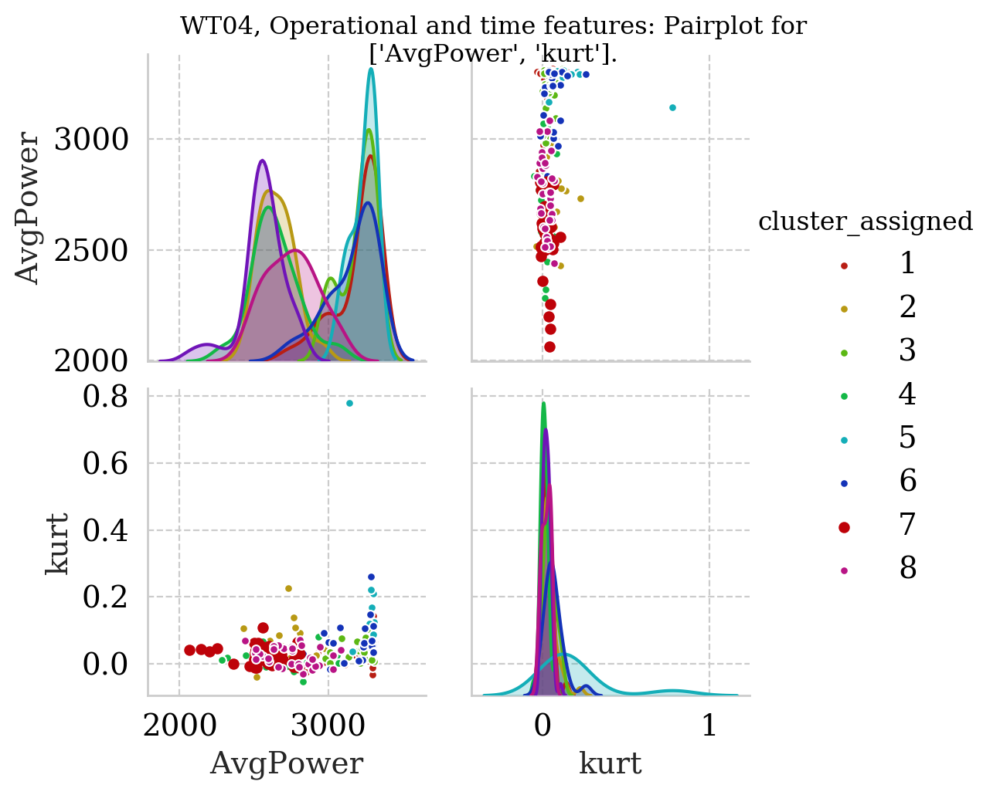

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


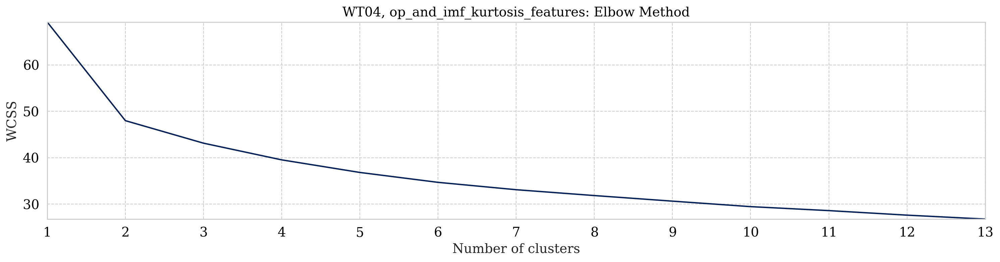

Did not replace


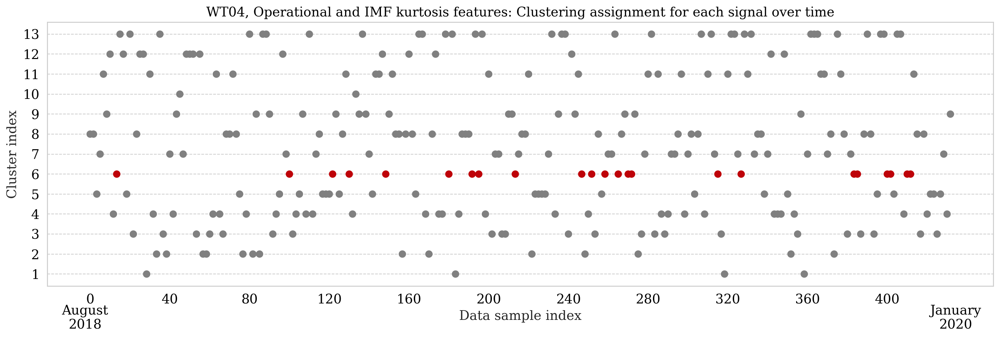

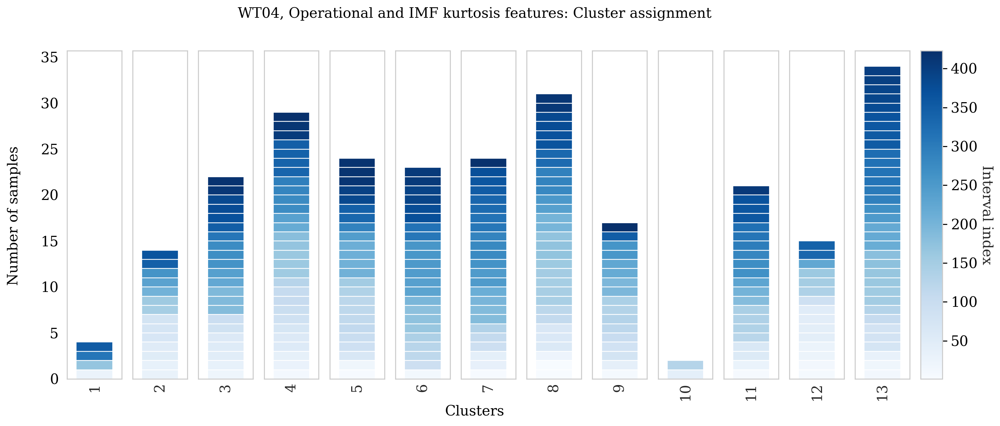

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,214.000000,1.0,25.0
1,14.0,150.642857,1.0,7.0
2,22.0,220.181818,5.0,23.0
3,29.0,200.310345,3.0,10.0
4,24.0,212.583333,5.0,21.0
5,23.0,245.521739,6.0,26.0
6,24.0,232.875000,4.0,17.0
7,31.0,208.032258,6.0,19.0
8,17.0,173.705882,1.0,6.0
9,2.0,84.500000,0.0,0.0


DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13]


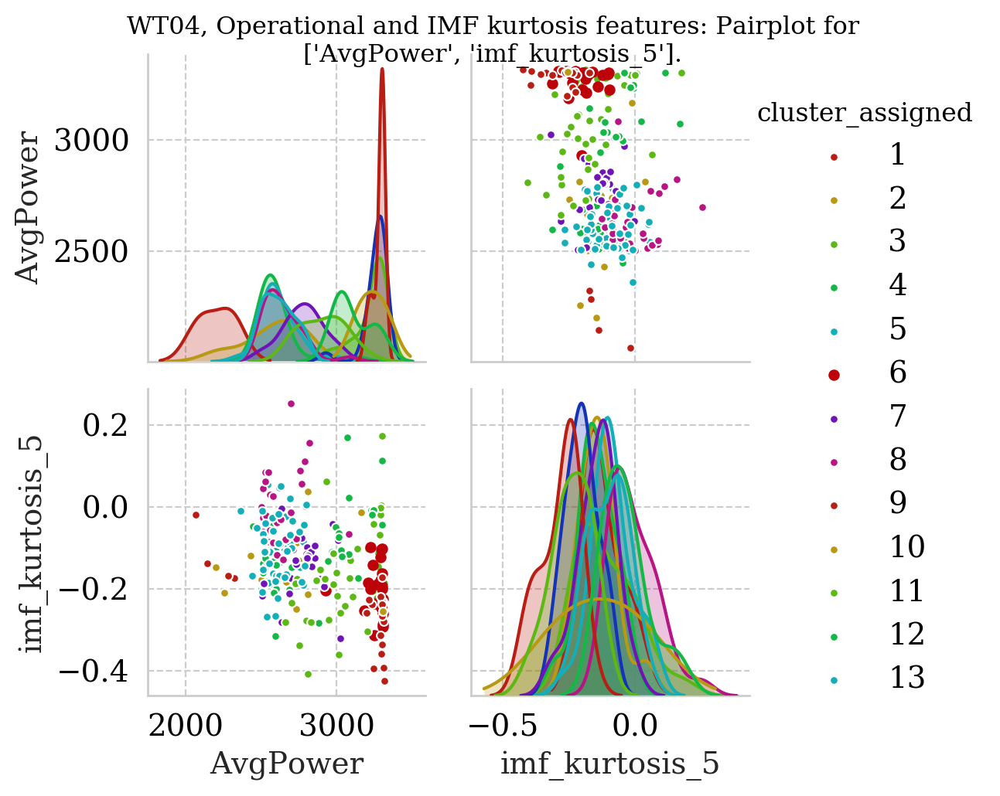

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


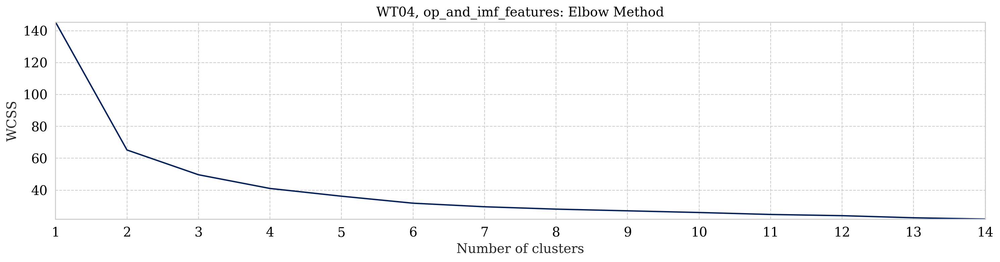

Did not replace


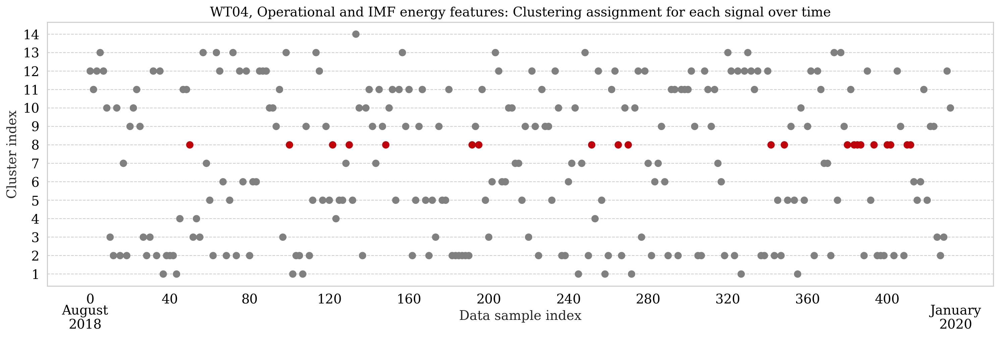

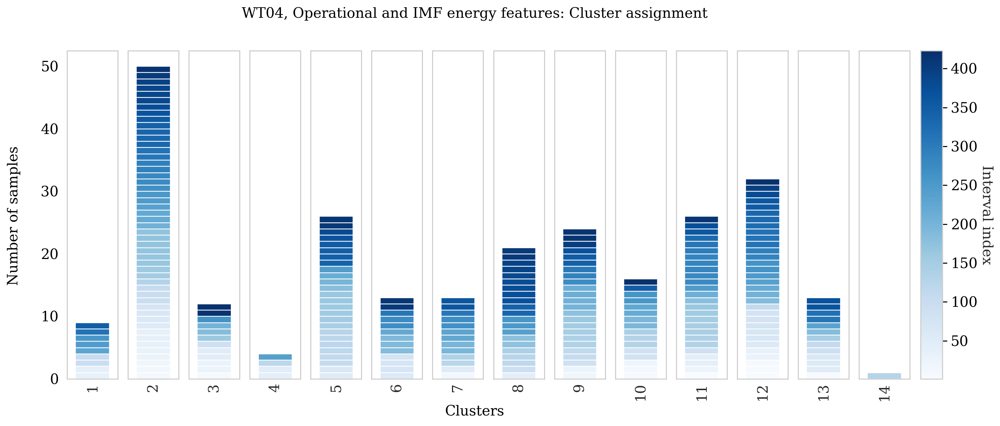

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,185.111111,0.0,0.0
1,50.0,209.340000,9.0,18.0
2,12.0,158.000000,2.0,17.0
3,4.0,111.750000,0.0,0.0
4,26.0,213.653846,5.0,19.0
5,13.0,210.923077,2.0,15.0
6,13.0,211.000000,2.0,15.0
7,21.0,274.761905,9.0,43.0
8,24.0,219.125000,5.0,21.0
9,16.0,170.687500,1.0,6.0


DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


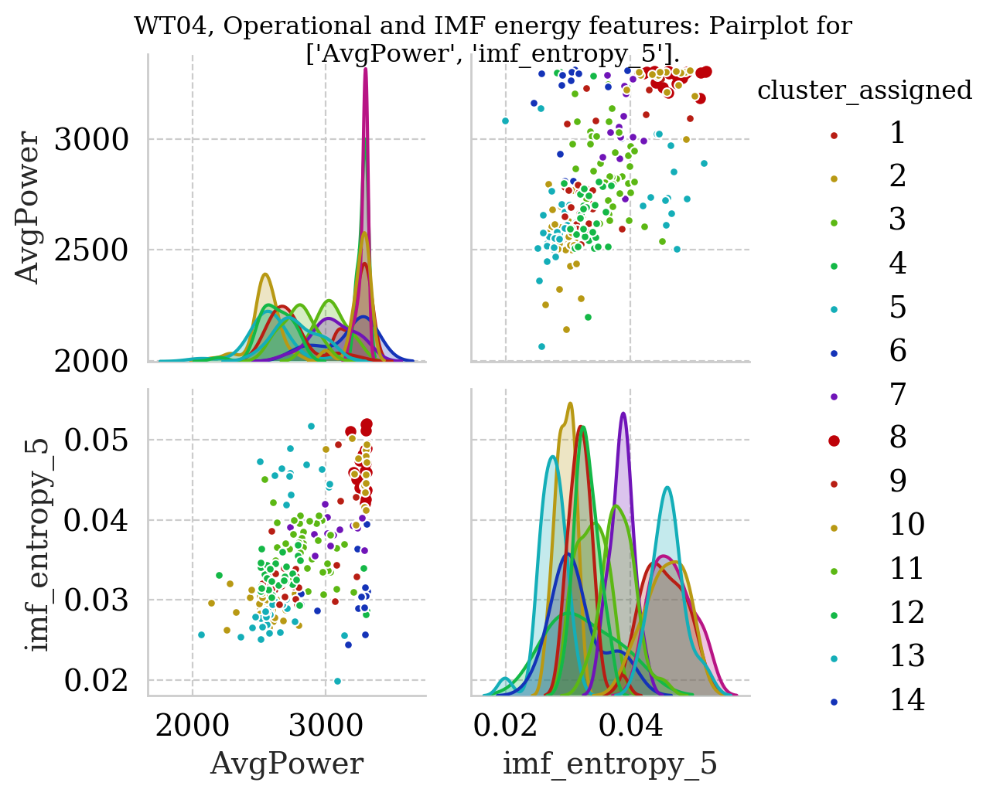

<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


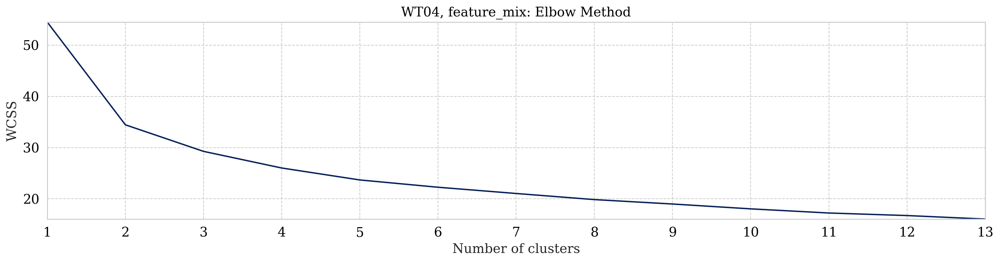

Did not replace


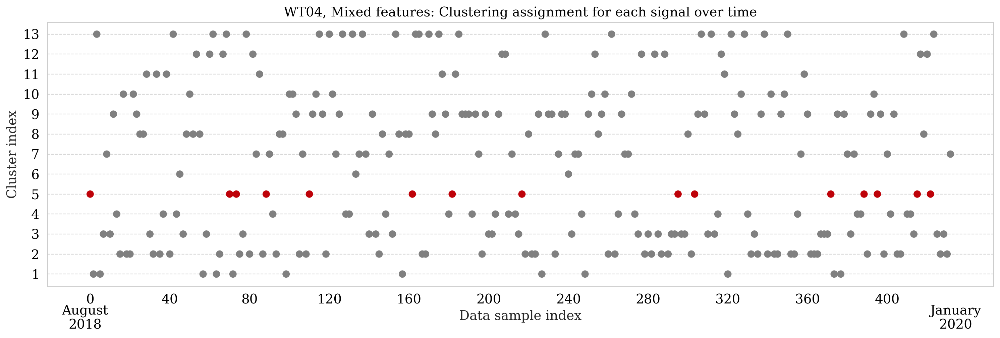

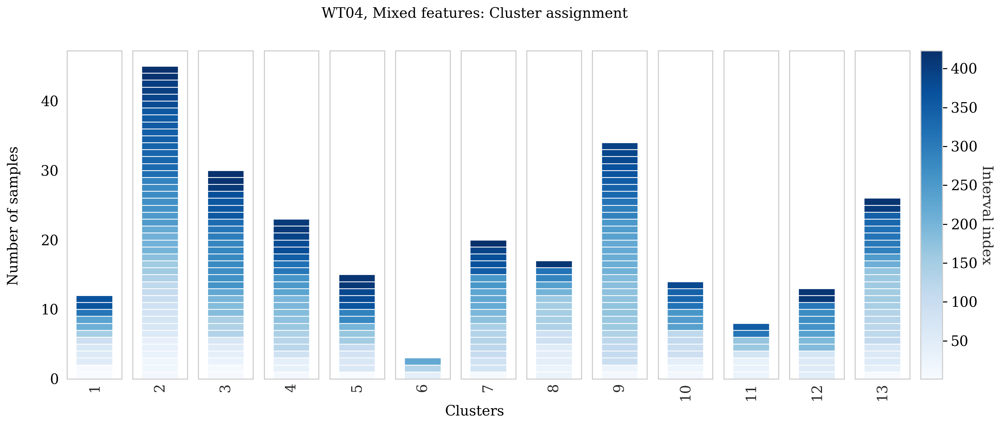

,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,158.750000,2.0,17.0
1,45.0,221.888889,9.0,20.0
2,30.0,232.266667,7.0,23.0
3,23.0,223.739130,5.0,22.0
4,15.0,223.733333,5.0,33.0
5,3.0,130.666667,0.0,0.0
6,20.0,212.900000,4.0,20.0
7,17.0,151.294118,1.0,6.0
8,34.0,224.294118,6.0,18.0
9,14.0,186.357143,1.0,7.0


DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13]


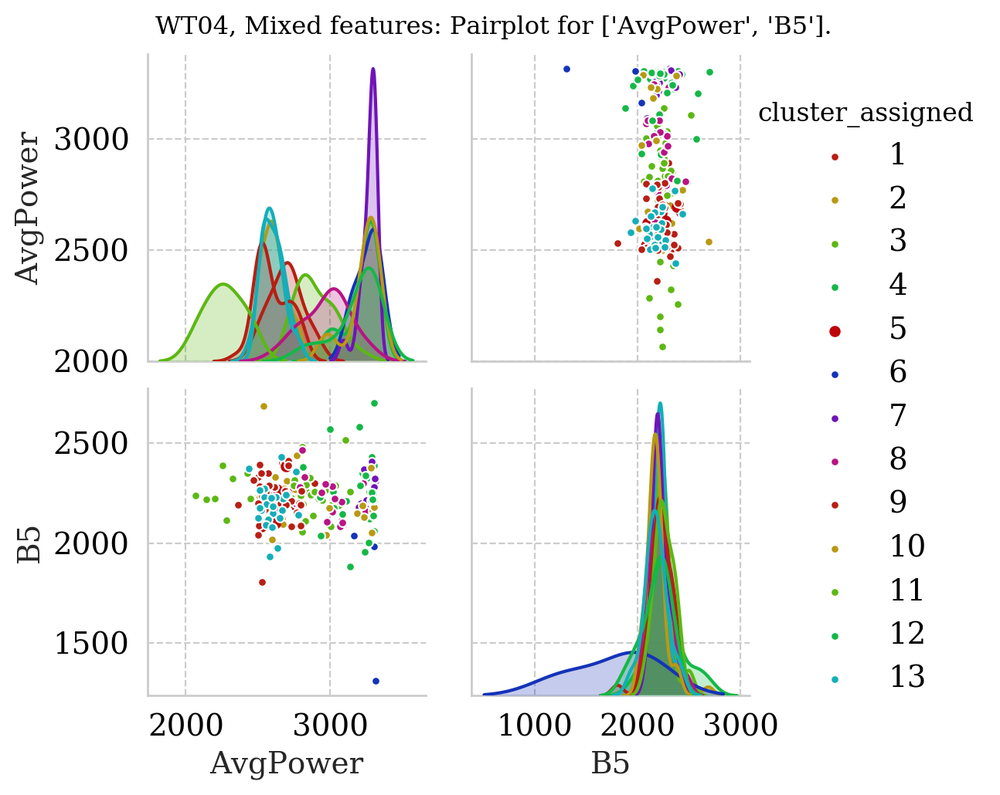

In [185]:


features_sets_titles= [
                'Operational and bi-spectrum features',
                'Operational and time features',
                'Operational and IMF kurtosis features',
                'Operational and IMF energy features',
                'Mixed features'
               ]

k_dictionary= {
    features_sets_names[0]:14 ,
    features_sets_names[1]: 8,    
    features_sets_names[2]: 13,
    features_sets_names[3]: 14,
    features_sets_names[4]: 13,
}
fsets_for_printing=[
    ['AvgPower','B1'],
    ['AvgPower','kurt'],
    ['AvgPower','imf_kurtosis_5'],
    ['AvgPower','imf_entropy_5'],
    ['AvgPower','B5']]

selected_cluster_dict = {
    features_sets_names[0]:11 ,
    features_sets_names[1]: 6,    
    features_sets_names[2]: 5,
    features_sets_names[3]: 7,
    features_sets_names[4]: 4,
}

wt_num = '4'
for i,features in enumerate(features_sets):
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))           
    
    assigned = run_kmeans(features_sets_titles[i],
                          '4',
                          features_sets_names[i],
                          features,
                          k_dictionary[features_sets_names[i]],
                          selected_cluster=selected_cluster_dict[features_sets_names[i]],
                          fset1=fsets_for_printing[i]
                         )

In [ ]:

assigned = run_kmeans('Complete data set','4','all_36_features',features,k_dictionary[features_sets_names[0]])


### Running through the different subsets of dataframes with dbscan

In [1399]:
import matplotlib
def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    plt.scatter(df.intervals_in_max_cluster,df.max_percentages,s=100,c=df.max_cluster_number,cmap='Blues',norm=normalize)
    plt.colorbar()
    plt.clim(0,29)
    ax.set_ylabel('Percentage of intervals in cluster with Index > 350')
    ax.set_xlabel('Total number of intervals in cluster')
    ax.set_title(f'WT{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features
               ]

print('Features cleaned')
wt_num='4'
df=kmeans(wt_num,features_cleaned,30)
plot_k_means_tuning(df,'All features')

for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])
    df=kmeans(features,30)
    display(df)
    plot_k_means_tuning(wt_num,df,features_sets_names[i])
    plt.show()    

Features cleaned


TypeError: kmeans() missing 1 required positional argument: 'max_cluster_num'

In [477]:
# How many sampels are in the last 50 intervals?
features_cleaned[features_cleaned['Index']>350].count()

Index               46
AvgPower            46
ActPower            46
WindSpeed           46
AvgSpeed            46
rms                 46
kurt                46
skewness            46
peak_to_peak        46
crest_factor        46
shape_factor        46
impulse_factor      46
margin_factor       46
signal_mean         46
std                 46
signal_energy       46
B1                  46
B2                  46
B3                  46
B4                  46
B5                  46
B6                  46
imf_rate_1          46
imf_rate_2          46
imf_rate_3          46
imf_rate_4          46
imf_rate_5          46
imf_entropy_1       46
imf_entropy_2       46
imf_entropy_3       46
imf_entropy_4       46
imf_entropy_5       46
imf_kurtosis_1      46
imf_kurtosis_2      46
imf_kurtosis_3      46
imf_kurtosis_4      46
imf_kurtosis_5      46
cluster_assigned    46
dtype: int64

In [89]:
# Dropping the time subset.
drop_time=pd.concat([operating_features,bispectrum_features,imf_features,imf_kurt_features],axis=1)

In [106]:
SELECTED_FEATURES=drop_time

df=kmeans(SELECTED_FEATURES,7)
display(df)
text=df.to_latex(index=True)
# plot_k_means_tuning(df,'All features except time.')
text

,max_cluster_number,intervals_in_max_cluster,max_percentages
0,2.0,97.0,20.0
1,3.0,70.0,19.0
2,4.0,71.0,18.0
3,5.0,38.0,24.0
4,6.0,38.0,24.0


'\\begin{tabular}{lrrr}\n\\toprule\n{} &  max\\_cluster\\_number &  intervals\\_in\\_max\\_cluster &  max\\_percentages \\\\\n\\midrule\n0 &                 2.0 &                      97.0 &             20.0 \\\\\n1 &                 3.0 &                      70.0 &             19.0 \\\\\n2 &                 4.0 &                      71.0 &             18.0 \\\\\n3 &                 5.0 &                      38.0 &             24.0 \\\\\n4 &                 6.0 &                      38.0 &             24.0 \\\\\n\\bottomrule\n\\end{tabular}\n'

[12, 53, 136, 180, 196, 266, 277, 278, 284, 299, 306, 307, 360, 372, 408, 421]


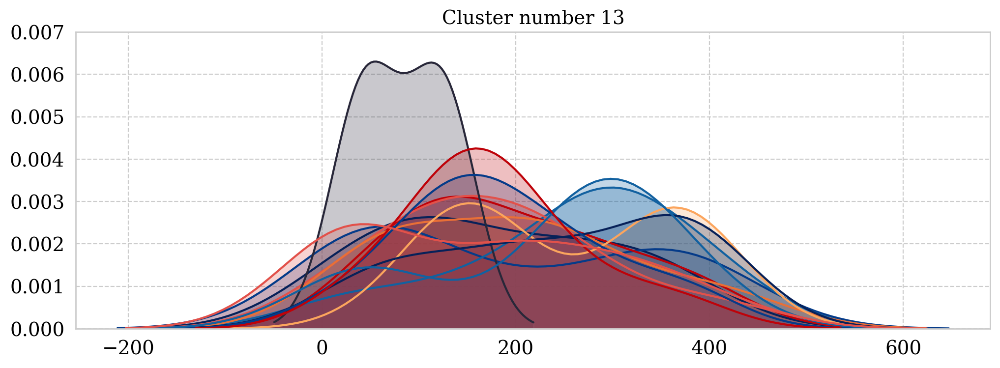

In [955]:
myDict = {}
y_cluster_kmeans=cluster_labels
min_clus = y_cluster_kmeans.min()


def map_index(index,feature_df):
    result=feature_df.iloc[index,:]['Index']
    return result


if not (min_clus == 0):
    if min_clus < 0:
        y_cluster_kmeans = y_cluster_kmeans + (min_clus*-1 )    
    elif min_clus > 0:
        y_cluster_kmeans = y_cluster_kmeans - min_clus
    min_clus = 0
# Placing the clustered points in cluster lists (where the lists in each key contain indexes)
for i, elem in enumerate(y_cluster_kmeans):
    if (elem in myDict):
        myDict[elem].append(i)
    else:
        myDict[elem] = [i]

for i in range(min_clus,len(myDict)): # Sorting the dictionaries
    np.sort(myDict[i])

# MAP THEM OVER TO NORMAL INDEX!

for i in range(min_clus,len(myDict)): # map these indexes to the actual indexes in the interval.
        index_list=myDict[i]
        new_list=[]
        for j,elem in enumerate(index_list):
            new_list.append(int(map_index(elem,features_cleaned)))
        myDict[i]=new_list



print(myDict[2])
    
for i in range(len(myDict)):
    ax=sns.kdeplot(myDict[i], shade=True,);   
    ax.set_ylim(0,0.007)
    ax.set_title(f'Cluster number {i+1}')
    
    # sns.distplot(myDict[i], bins=20, kde=False, rug=True);
    #plt.show()

    

*---------------------------------------------------------------*
op_and_bispec_features


TypeError: plot_clusters() missing 2 required positional arguments: 'y_cluster_kmeans' and 'feature_df'

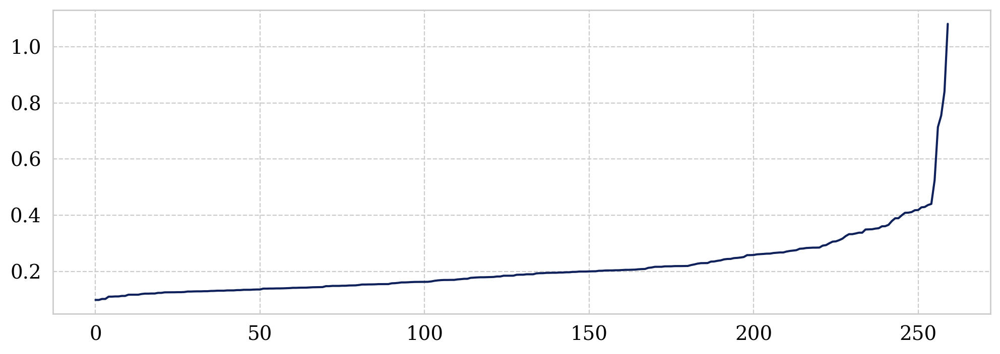

In [193]:
def db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max,kind='raw'):
    '''
    Extract paramaters to optimize the DB scan.
    
    Args:
        SELECTED_FEATURES (pd.DataFrame): Df with ml features to cluster. Should be MinMaxScaled!
        min_samples_max (int): States the max number of intervals (points) needed to form a cluster.
        eps_range_max (int): States the max distance to neighbouring point which is included in same cluster.
    Returns:
        df (pd.DataFrame): Containing stats on the cluster with the highest amount of indexes > 350.
    '''
    min_samples_range = np.arange(5,min_samples_max)
    eps_range = np.linspace(0.3,eps_range_max,50)#100

    eps_res = []
    uniques_array = []
    min_samples_array=[] # Array with ints that state how many intervals is required to form a cluster
    intervals_in_max_cluster=[]
    max_percentages=[]
    final_df = []
    for i in tqdm(min_samples_range):
        for j,eps in enumerate(eps_range):
            cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,kind,eps=eps,min_samples=i,plot=False) # Cluster the points
            clusterDict = clustering.plot_clusters(cluster_labels,SELECTED_FEATURES,False)
            cluster_stats_df=calculate_cluster_stats(clusterDict)

            # the cluster with max intervals greater that 350
            max_percentage=(cluster_stats_df['percentage_intervals_greater_than_350'].max()) 
            # Find the row with this max_percentage
            temp=cluster_stats_df[cluster_stats_df['percentage_intervals_greater_than_350']==max_percentage]


            # Extract the number of intervals in this cluster 
            interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())

            eps_res.append(eps)
            min_samples_array.append(i) 
            intervals_in_max_cluster.append(interval_in_cluster)
            max_percentages.append(max_percentage)

    final_df.append(eps_res)
    final_df.append(min_samples_array)
    final_df.append(intervals_in_max_cluster)
    final_df.append(max_percentages)
    
    final_df=np.asarray(final_df)
    
    print(final_df.shape)
    final_df=pd.DataFrame(final_df.T,columns=['eps','samples_needed_to_form_cluster','intervals_in_max_cluster','max_percentages'])
    return final_df

assert features_cleaned.shape[0] == 260 # make sure noise is removed!

#SELECTED_FEATURES=features_cleaned
#eps_range_max= 1
#min_samples_max=11

#df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
#fig,ax=plt.subplots()
#df.plot.scatter(x='eps',y='samples_needed_to_form_cluster',c='max_percentages',cmap='Blues',s=50,ax=ax)
#ax.set_ylabel('samples_needed_to_form_cluster')
#ax.set_xlabel('eps')
#maximum = df['max_percentages'].max()
#rows=df[df['max_percentages']==maximum]


for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])

    SELECTED_FEATURES=features
    eps_range_max= 0.7
    min_samples_max=10
    df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
    #pandas.set_option('display.max_rows', df.shape[0]+1)
    #display(df)
    display(df)
    fig,ax=plt.subplots()
    df.plot.scatter(x='samples_needed_to_form_cluster',y='eps',c='max_percentages',cmap='Blues',s=50,ax=ax)
    ax.set_ylabel('eps')
    ax.set_xlabel('samples_needed_to_form_cluster')
    ax.set_title('8 PCA components')
    plt.show()
    '''
    optimized_eps=1
    optimized_min_samples=4

    cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,'raw',eps=optimized_eps,min_samples=optimized_min_samples,plot=True) # Cluster the points
    cluster_dict=clustering.plot_clusters(cluster_labels,SELECTED_FEATURES) # plot the clusters
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot 1
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels) # pair plot 2
    df=calculate_cluster_stats(cluster_dict) 
    '''